In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import os
import json
import pandas_datareader.data as web   # my local kernel Python 3.10.7 
import matplotlib.pyplot as plt  # unavailable?  do: 1. pip uninstall matplotlib # 2. python3 -m pip install matplotlib
%matplotlib inline
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import datetime
import io

In [24]:
if os.path.exists("C:\August2022\ES 12-22 Globex_2022_09_19Minute.csv"):  #  "C:\August2022\ES 12-22 Globex_2022_09_19Minute.csv"
    es = pd.read_csv("C:\August2022\ES 12-22 Globex_2022_09_19Minute.csv", index_col= 0, parse_dates=True)
else:
    es = yf.Ticker("C:\August2022\ES 12-22 Globex_2022_09_19Minute.csv")
    es.to_csv("ES_Aug_21_2022_1min.csv")

In [74]:
#   new dataset- hopefully without breaks   :    "C:\August2022\ES 12-22 Globex_2022_09_19.csv"
es = pd.read_csv("C:\August2022\ES 12-22 Globex_2022_09_19.csv", index_col= 0, parse_dates=True )

In [314]:
es3 = es['2022-09-19 00:00:02':'2022-09-19 16:20:00'].copy() # below continue with es3
es3.tail()

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,
2022-09-19 16:19:51,2,-1,3917.75,-29.0,-5.0,-155.0,595.0,-126.101695,-133.851356,-60.171100,66.666667,65.666667,50.500000,0.0,0.0,3917.75,3918.25,132.0,625.0,-87.0
2022-09-19 16:19:51,2,-1,3917.75,-31.0,-7.0,-155.0,593.0,-189.152542,-134.118023,-60.197767,51.666667,65.666667,50.444444,0.0,0.0,3917.75,3918.25,132.0,623.0,-89.0
2022-09-19 16:19:51,1,-1,3917.75,-31.0,-9.0,-155.0,591.0,-196.497175,-134.384690,-60.224433,52.500000,65.666667,50.388889,0.0,0.0,3917.75,3918.25,132.0,621.0,-89.0
2022-09-19 16:19:51,1,1,3918.00,-29.0,-9.0,-155.0,591.0,-196.497175,-134.497659,-60.255596,54.166667,65.777778,50.361111,0.0,0.0,3917.75,3918.25,134.0,621.0,-87.0
2022-09-19 16:19:53,1,-1,3917.75,-31.0,-11.0,-157.0,589.0,-203.389831,-134.764326,-60.251100,55.000000,65.777778,50.305556,0.0,0.0,3917.75,3918.25,134.0,619.0,-87.0


In [320]:
es.head()
type(es.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [319]:
es3.shape  # (1321251, 17)    aprox 82500 rows for each hour   6880 aprox for each 5 min ;  13000 rows aprox for 10 min intervals

(1321251, 20)

In [318]:
type(es3.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [77]:
es.head()

,1,AtAsk,3881.75,3882,3882.1
2022-09-19 00:00:00,,,,,
2022-09-19 00:00:02,1,AtAsk,3881.75,3882.25,3882.25
2022-09-19 00:00:03,1,AtBid,3882.00,3882.25,3882.00
2022-09-19 00:00:03,1,AtBid,3882.00,3882.25,3882.00
2022-09-19 00:00:03,1,AtBid,3882.00,3882.25,3882.00
2022-09-19 00:00:03,1,AtBid,3882.00,3882.25,3882.00


### Derive basic time metrics columns and convert categorical to numerical

In [83]:
mapping = {'AtBid': -1, 'AtAsk': 1, 'BelowBid': -2, 'AboveAsk': 2, 'BetweenBidAsk':0 }   # remap categorical ---->  ints 
es = es.replace({'AtAsk': mapping})

In [80]:
del es['3881.75']
del es['3882']

In [84]:
es.head()

,1,AtAsk,3882.1
2022-09-19 00:00:00,,,
2022-09-19 00:00:02,1,1,3882.25
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00


In [85]:
es.head()

,1,AtAsk,3882.1
2022-09-19 00:00:00,,,
2022-09-19 00:00:02,1,1,3882.25
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00


In [86]:
es.loc['2022-09-19 09:00:00' : '2022-09-19 11:00:00',].head()


,1,AtAsk,3882.1
2022-09-19 00:00:00,,,
2022-09-19 09:00:00,1,1,3862.75
2022-09-19 09:00:00,1,1,3862.75
2022-09-19 09:00:00,1,1,3862.75
2022-09-19 09:00:00,1,1,3862.75
2022-09-19 09:00:00,3,1,3862.75


In [87]:
type(es.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [88]:
es.dtypes  # 
# type(es.index)   # pandas.core.indexes.datetimes.DatetimeIndex

1           int64
AtAsk       int64
3882.1    float64
dtype: object

In [37]:
del es["Bid"]  #  from old dataset
del es['Ask']   #  from old dataset 

In [96]:
es.rename({'3882.1': 'Price', 'AtAsk': 'BidAsk', '1':'Vol' }, axis=1, inplace=True)

In [53]:
es.rename({'Close': 'Price'}, axis=1, inplace=True)  # from old set

In [97]:
es.head()

,Vol,BidAsk,Price
2022-09-19 00:00:00,,,
2022-09-19 00:00:02,1,1,3882.25
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00
2022-09-19 00:00:03,1,-1,3882.00


### Features: BidAsk in last 2000, 1000, 500 transactions

 - aprox 82500 rows for each hour ; 13000 rows aprox for 10 min intervals;   6900 aprox for each 5 min ;  1 min = 1400

In [126]:
es3['BA_10min'] = es3['BidAsk'].rolling(14000).sum() # GOOD ONE
# del es['BA_15min'] #  = es['BidAsk'].rolling(900).sum() # GOOD ONE
es3['BA_5min'] = es3['BidAsk'].rolling(7000).sum() # GOOD ONE
es3['BA_1min'] = es3['BidAsk'].rolling(1400).sum() # GOOD ONE

In [129]:
es3.sample()

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,
2022-09-19 10:37:05,3,-1,3894.25,-178.0,24.0,146.0,207.0,-243.728814,-57.557191,-36.352236,23.333333,53.0,57.25,0.0,0.0,3895.75,3896.5,1837.0,682.0,52.0


In [104]:
es.head(3)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K
2022-09-19 00:00:00,,,,,,,
2022-09-19 00:00:02,1,1,3882.25,NaN,NaN,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN


In [130]:
es3['BA_St_1min'] = (es3['BidAsk'].rolling(1400).mean()  - es3['BidAsk'].rolling(1400).var())  / (es3['Price'].rolling(1400).max() - es3['Price'].rolling(1400).min()) * 100 # Stochastic BidAsk 
es3['BA_St_5min'] = (es3['BidAsk'].rolling(7000).mean() - es3['BidAsk'].rolling(7000).var()) / (es3['Price'].rolling(7000).max()- es3['Price'].rolling(7000).min()) * 100 # Stochastic BidAsk
es3['BA_St_10min'] = (es3['BidAsk'].rolling(14000).mean() - es3['BidAsk'].rolling(14000).var()) / (es3['Price'].rolling(14000).max()- es3['Price'].rolling(14000).min()) * 100 # Stochastic BidAsk



In [ ]:
# 60 seconds * 5 = 300 =      5 min period = 300 Rolling second ticks  (rows)
#   10 min = 600  (rows)  ;    1 min = 60   (rows)

In [106]:
es.sample(5)  # old dataset with breaks

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min
2022-09-19 00:00:00,,,,,,,,,,
2022-09-19 13:12:41,1,1,3887.00,-32.0,-82.0,-114.0,-488.0,-203.389831,-143.993162,-145.975678
2022-09-19 14:15:10,1,1,3882.75,0.0,-64.0,-165.0,-181.0,-10.169492,-139.934300,-103.198186
2022-09-19 07:11:20,1,1,3858.75,-5.0,-63.0,134.0,473.0,-203.389831,-53.483891,-49.092899
2022-09-19 11:17:35,1,1,3898.50,173.0,119.0,302.0,380.0,245.423729,-23.956249,-33.251486
2022-09-19 15:35:28,1,-1,3913.75,29.0,-81.0,-124.0,-80.0,-77.740113,-212.552285,-73.778779


#### Stochastic:   %K = ( C − L14  / H14 − L14  ) × 100
- C: latest Price
- L14: Lowest within 14 period
- H14: Higest within 14 period
- %K: Current Stochastik Value
- esT3['Stoch20'] = es['Price'].rolling(20).mean()

In [131]:
es3['Prc_St_1min'] = (es3['Price'].rolling(1400).mean()  - es3['Price'].rolling(1400).min())  / (es3['Price'].rolling(1400).max() - es3['Price'].rolling(1400).min()) * 100 # Stochastic
es3['Prc_St_5min'] = (es3['Price'].rolling(7000).mean() - es3['Price'].rolling(7000).min())   / (es3['Price'].rolling(7000).max()- es3['Price'].rolling(7000).min()) * 100 # Stochastic
es3['Prc_St_10min'] = (es3['Price'].rolling(14000).mean() - es3['Price'].rolling(14000).min())  / (es3['Price'].rolling(14000).max()- es3['Price'].rolling(14000).min()) * 100 # Stochastic

### MACD MACD = 12Periods EMA − 26Periods EMA

In [132]:
es3['MACD_1min']  = (es3['Price'].rolling(1400).mean() - es3['Price'].rolling(1400).mean() ) * 100  #  MACD 
es3['MACD_5min'] =  (es3['Price'].rolling(7000).mean() - es3['Price'].rolling(7000).mean()) * 100  #  MACD 

In [133]:
es.Prc_St_10min.min() # 21.9800000000032  Min and Max of Stochastic vals  13.90000000001237 old set   ; 12.874999999985448
es.Prc_St_10min.max() # 80.06666666666811  #  81.36000000000422  ; new set     86.44444444447194

86.44444444447194

In [114]:
es.sample()

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min
2022-09-19 00:00:00,,,,,,,,,,,,,,,
2022-09-19 14:24:52,1,1,3880.25,13.0,-153.0,70.0,-325.0,-362.033898,-160.854849,-108.267112,81.666667,52.555556,69.416667,0.0,0.0


In [139]:
es3['P_Shift_5Min'] = es3['Price'].shift(700)    #    Price shifted 5 min in future
es3['P_Shift_10Min'] = es3['Price'].shift(14000)   #    Price shifted 10 min in future


In [116]:
es.tail()

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,
2022-09-19 23:59:53,1,1,3926.00,-90.0,-69.0,23.0,83.0,-238.983051,-103.22107,-75.271666,55.833333,41.333333,37.200000,0.0,0.0,3925.5,3926.50
2022-09-19 23:59:53,1,1,3926.00,-88.0,-69.0,25.0,83.0,-235.254237,-103.22107,-75.382963,56.666667,41.500000,37.166667,0.0,0.0,3925.5,3926.25
2022-09-19 23:59:53,1,1,3926.00,-86.0,-69.0,27.0,83.0,-231.073446,-103.22107,-75.492479,57.500000,41.666667,37.133333,0.0,0.0,3925.5,3926.25
2022-09-19 23:59:53,1,1,3926.00,-84.0,-69.0,29.0,85.0,-226.440678,-103.22107,-75.568214,58.333333,41.833333,37.100000,0.0,0.0,3925.5,3926.25
2022-09-19 23:59:55,1,1,3926.25,-84.0,-69.0,31.0,85.0,-147.570621,-103.22107,-75.568214,40.000000,42.083333,37.066667,0.0,0.0,3925.5,3926.50


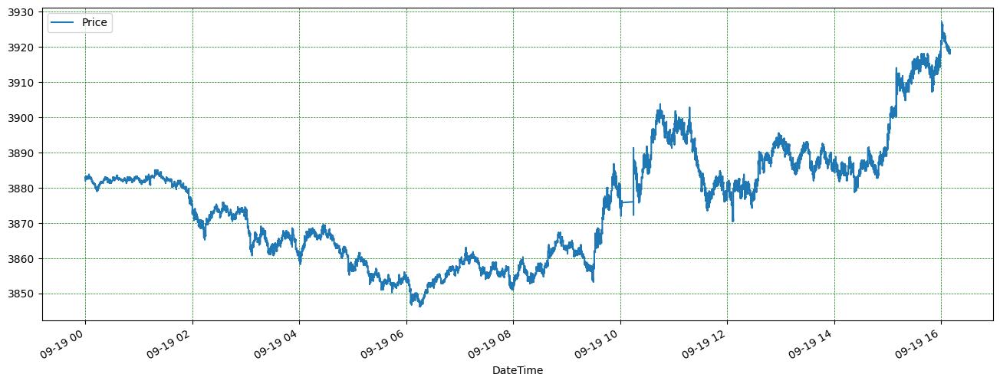

In [70]:
es["2022-09-19 00:00:00":"2022-09-19 16:10:00"].plot( y=['Price' ], figsize=(16,6))    # Price and PriceShifted by 5 and 10 min approx 30 secs and 160 secs shifted in future
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)       # old set with break 

In [ ]:
# seems there is a break in data set around 10 am. New set needs to get generated without the missing values...

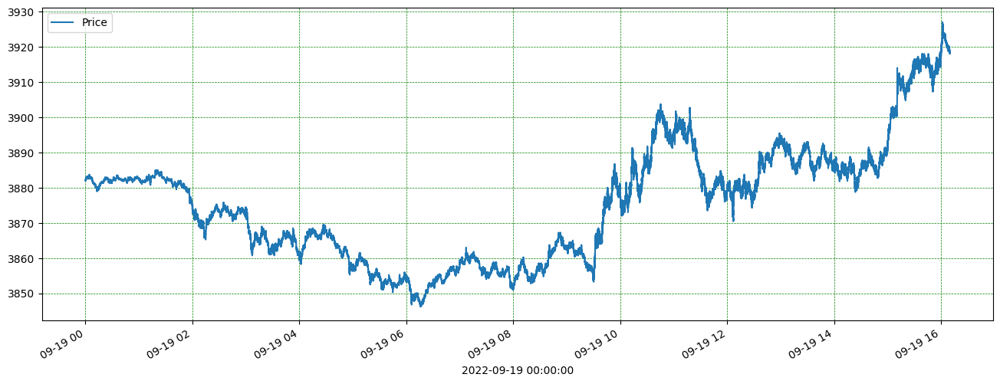

In [117]:
# new set seems to not have break 
es["2022-09-19 00:00:00":"2022-09-19 16:10:00"].plot( y=['Price' ], figsize=(16,6))    # Price and PriceShifted by 5 and 10 min approx 30 secs and 160 secs shifted in future
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

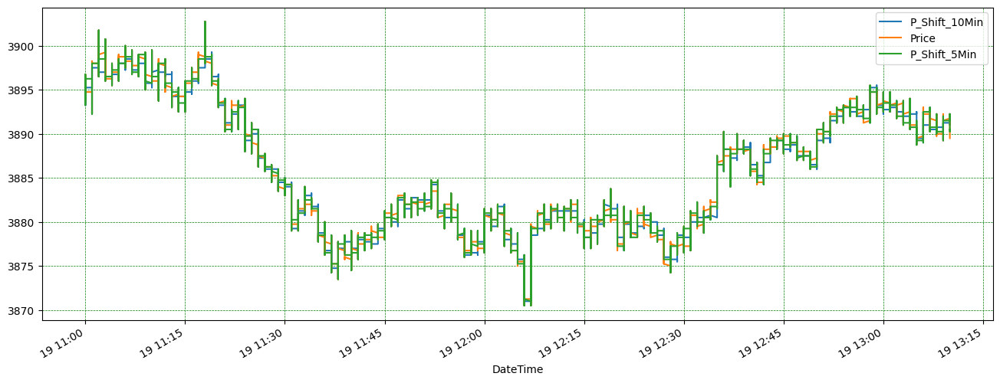

In [71]:
es["2022-09-19 11:00:00":"2022-09-19 13:10:00"].plot( y=['P_Shift_10Min','Price', 'P_Shift_5Min' ], figsize=(16,6))    # Price and PriceShifted by 5 and 10 min approx 30 secs and 160 secs shifted in future
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)  # old set

- The rows are any  tick observations happening per given second- some may have 100 or 2K or 3K per minute. They are not constant and therefore   

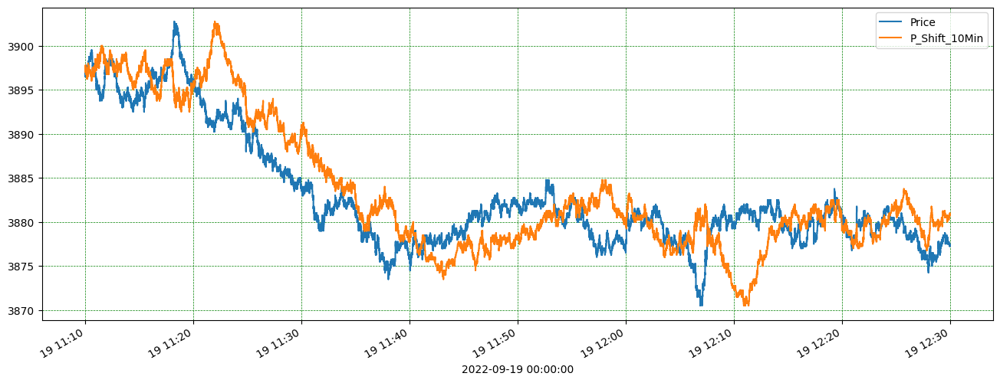

In [141]:
es3["2022-09-19 11:10:00":"2022-09-19 12:30:00"].plot( y=['Price', 'P_Shift_10Min' ], figsize=(16,6))    # Price and PriceShifted by 5 and 10 min approx 30 secs and 160 secs shifted in future
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5) 

###  BidAsk, Vol, Price derived features

In [142]:
es3['Vol_avg2k_PT'] = es3['Vol'].rolling(2000).mean()  *  ( es3['Price'].rolling(2000).min() - es3['Price'].rolling(2000).max()   ) * 100
es3['Vol_CumS_PT'] = es3['Vol'].rolling(7000).sum() *  ( es3['Price'].rolling(7000).min() - es3['Price'].rolling(7000).max()   )

es3['BA_CumSumPT4h'] = es3['BidAsk'].cumsum() *  ( es3['Price'].rolling(4000).min() - es3['Price'].rolling(4000).max()   ) / 1000  #   cumulative sum delta of Bid/Ask * Price delta
es3['BA_CumSumPT7K'] = es3['BidAsk'].cumsum() *  ( es3['Price'].rolling(7000).var() - es3['Price'].rolling(7000).std()   ) / 1000  # cumulative sum delta of Bid/Ask * Price spread - std


In [144]:
es3.shape  # (1814632, 23)  (1365444, 20)
# es['BA_CumSumPT4h'].max()

(1321251, 25)

In [145]:
es3.sample(2)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,...,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,,
2022-09-19 12:04:37,1,1,3877.50,6.0,-41.0,-138.0,-270.0,-54.828449,-23.009873,-18.320030,...,3878.00,3876.75,323.0,-316.0,-139.0,0.0,-264.900,-45680.75,4.54575,-0.364483
2022-09-19 07:39:35,1,-1,3857.25,-53.0,96.0,161.0,-140.0,-23.685739,-15.429843,-13.310573,...,3857.25,3856.75,528.0,-59.0,215.0,0.0,-569.025,-68897.50,12.25025,-5.296302


In [31]:
es1 = es.copy()  # copy to new df before adding additional features

Derivatives of Price

In [ ]:
#  Skip some of the lower features for this exercise

In [153]:
es3['STD_20k'] = es3['Price'].rolling(2000).std()  # std every 2000 rows
es3['AVG_20k'] = es3['Price'].rolling(2000).mean() # mean every 2000 rows
es3['AVG_20k_Vol'] = es3['Vol'].rolling(2000).mean() #  Vol mean every 2000 rows
es3['Price_R_BA_V'] = es3['Price'] * es3['STD_20k'] / (es3['AVG_20k']) #  200 rows calc of Price * STD / mean ratio
es3['BA_Price_V'] = es3['BidAsk'] * es3['Price'] / es3['Vol'] 
#-------------------------- Moving Averages
es3['STD20K'] = es3['Price'].rolling(20000).std()
es3['MA30K'] = es3['Price'].rolling(30000).mean() 
es3['MA50K'] = es3['Price'].rolling(50000).mean() 
es3['MA70K'] = es3['Price'].rolling(70000).mean() 
es3['MA100K'] = es3['Price'].rolling(100000).mean() 
es3['MA200K'] = es3['Price'].rolling(200000).mean() 
es3['MA300K'] = es3['Price'].rolling(300000).mean() 
#----------------------------------- Derivatives from MA, Vol, variation, mean, Vol
es3['Var_Vol_100K'] = es3['Price'].rolling(100000).var() / es3['Price'].rolling(100000).mean()
es3['Var_MinMax_MA20K'] = es3['Price'].rolling(20000).var()   *  es3['Price'].rolling(20000).min()  / es3['Price'].rolling(20000).max() 
es3['Var_ver'] = es3['Price'].rolling(20000).var() / es3['Price'].rolling(10000).var() * 100 # Price variance difference over 20K / 10K 
# -------------------------- BidAsk * Volume / mean of interval
es3['BA_Vol_Avg40K'] = es3['BidAsk'].rolling(40000).var() *  es3['BidAsk'].rolling(40000).sum()  * es3['Vol'].rolling(40000).mean() 
es3['BA_BA_Avg40K'] = es3['BidAsk'].rolling(40000).var() *  es3['BidAsk'].rolling(40000).sum()  * es3['BidAsk'].rolling(40000).mean() 
#-------------------------- adding rolld 5T Volume summed
es3['5_val'] = es3.rolling('5T').Vol.sum() # (1814632,) 
#-------------- shifted Price_Target  and Price_Target5 columns 
es3['Price_Target'] = es3['Price'].shift(8000)  #  amounts to some 30 seconds of avr ticks (transactions) for 5 min we need greater amount of avg ticks, like 80,000
es3['Price_Target5'] = es3['Price'].shift(80000) # about 5 min shift
es3['B_A_CumSum'] = es3['BidAsk'].cumsum()  # cumulative sum delta of Bid/Ask

'B_A_CumSumAvr2K','B_A_CumSumAvr5K','B_A_CumSumAvr10K'

In [154]:
es3['B_A_CumSumAvr2K'] = es3['BidAsk'].rolling(2000).mean()  #  sum delta of Bid/Ask over 2K
es3['B_A_CumSumAvr5K'] = es3['BidAsk'].rolling(5000).mean() #  sum delta of Bid/Ask over 10K
es3['B_A_CumSumAvr10K'] = es3['BidAsk'].rolling(10000).mean() #  sum delta of Bid/Ask over 5K

In [155]:
es3.shape  # (1814632, 47)

(1321251, 49)

In [156]:
pd.set_option('display.max_columns', None) # display all columns
es3.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-19 12:59:09,1,-1,3894.50,-18.0,8.0,296.0,-221.0,-46.602675,-26.430939,-16.886305,62.897959,45.335294,50.496703,0.0,0.0,3895.25,3890.25,385.0,-263.0,246.0,0.0,-541.9375,-45815.00,3.08550,-0.009835,0.1480,-0.0442,0.0132,0.860226,3894.346375,1.6675,0.860260,-3894.5000,2.385830,3889.865883,3888.492695,3885.681614,3883.974905,3881.419009,3885.179718,0.006872,5.678304,586.174426,148.149472,0.244735,12506.0,3892.25,3882.25,-726
2022-09-19 10:59:23,1,-1,3894.75,14.0,101.0,356.0,230.0,-75.459532,-22.159446,-18.978237,53.814286,44.945238,48.884014,0.0,0.0,3894.00,3894.00,335.0,74.0,79.0,0.0,-437.7000,-44406.00,-10.72875,-0.099241,0.1780,0.0460,0.0536,0.661424,3893.975250,1.4590,0.661555,-3894.7500,1.705528,3895.255583,3897.326045,3897.802911,3895.939272,3890.022795,3886.084533,0.004756,2.903229,205.370759,-2362.750599,63.932808,16529.0,3896.25,3896.50,2861
2022-09-19 11:57:29,4,-1,3877.25,-6.0,-298.0,-460.0,-1020.0,-96.268695,-19.272313,-13.415699,56.000000,48.893651,53.611429,0.0,0.0,3876.50,3882.00,-1090.0,-1094.0,-358.0,0.0,-412.0875,-73845.00,5.32800,-1.195166,-0.2300,-0.2040,-0.1075,0.656110,3877.165125,1.4985,0.656124,-969.3125,1.870612,3880.973450,3879.353380,3879.580432,3881.843095,3888.905236,3890.579616,0.004948,3.491308,127.718108,291.919206,0.848981,20596.0,3881.50,3885.50,-1184
2022-09-19 15:45:56,1,-1,3917.50,151.0,225.0,113.0,145.0,-36.167221,-26.239434,-26.580418,43.964286,45.166071,51.159821,0.0,0.0,3916.00,3916.25,-237.0,-7.0,209.0,0.0,-378.0000,-42352.00,-5.01800,-0.276966,0.0565,0.0290,-0.0209,0.556070,3916.583875,1.5120,0.556200,-3917.5000,0.810268,3915.613050,3915.249095,3914.012482,3912.606982,3903.388146,3897.493687,0.002495,0.655864,127.850284,-236.351113,0.603079,18421.0,3915.50,3909.50,1544
2022-09-19 06:55:35,1,-1,3855.25,-100.0,-93.0,139.0,978.0,-49.790667,-16.970422,-10.379667,57.707792,56.348000,50.459161,0.0,0.0,3857.50,3850.50,1004.0,1298.0,-24.0,0.0,-355.7125,-56100.00,15.62000,-2.691925,0.0695,0.1956,0.1520,0.661494,3856.698875,1.2935,0.661245,-3855.2500,2.947739,3853.643783,3857.902190,3860.763379,NaN,NaN,NaN,NaN,8.663262,92.906104,-424.043297,2.282565,1858.0,3850.75,3883.50,-3124
2022-09-19 15:18:16,2,-1,3908.75,56.0,-42.0,-60.0,-346.0,-51.889870,-24.718851,-25.561619,50.616071,48.598413,48.284921,0.0,0.0,3908.25,3910.25,-595.0,-320.0,-54.0,0.0,-353.6000,-49567.50,1.86750,-0.082262,-0.0300,-0.0692,-0.0287,0.470630,3908.209000,1.7680,0.470695,-1954.3750,1.163887,3909.808467,3907.316615,3904.433171,3899.265420,3892.356559,3891.166969,0.022734,1.352816,119.397545,2698.277327,59.242174,26482.0,3910.25,3888.50,-415
2022-09-19 14:41:23,4,-1,3887.50,-58.0,-197.0,-131.0,-372.0,-37.567310,-23.124891,-15.260117,49.428571,49.333835,55.550000,0.0,0.0,3888.25,3885.50,992.0,-502.0,-195.0,0.0,-645.6000,-60377.25,12.14700,-1.316339,-0.0655,-0.0744,0.0473,0.848409,3888.437750,2.1520,0.848204,-971.8750,1.694743,3887.087000,3885.281240,3885.330068,3885.516288,3887.292689,3885.859337,0.001596,2.867171,205.092769,1994.856873,29.415119,25293.0,3890.25,3885.25,-4049
2022-09-19 13:57:05,1,1,3888.75,-2.0,70.0,7.0,98.0,-68.963477,-23.470000,-17.804921,50.178571,52.073016,43.948901,0.0,0.0,3889.25,3892.00,-1022.0,7.0,-33.0,0.0,-308.9000,-51952.50,6.77700,-0.165063,0.0035,0.0196,-0.0240,0.371560,3889.139125,1.5445,0.371523,3888.7500,1.664370,3888.463225,3887.902735,3887.894500,3888.859033,3886.216901,3883.779388,0.002083,2.765147,323.337231,-1122.579858,10.

In [157]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum'],
      dtype='object')

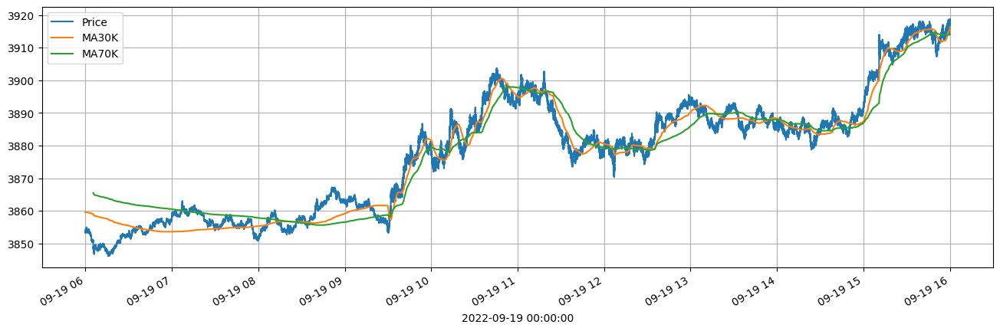

In [161]:

es3["2022-09-19 06:00:00":"2022-09-19 16:00:00"].plot( y=['Price', 'MA30K', 'MA70K'],figsize=(16,5)) # normal Price plot 13 to 4 w 2 moving avrgs.
plt.grid()

In [48]:
es1.shape   # (1814632, 47)    1814632 ticks ; 144 5min intervals in 24 hrs; aprox 12,600 for each 5 min intervals; we will want calculations each 12,600 ticks to consider intervals of 5 min on avg. 
# es1.columns

(1814632, 47)

#### IDE

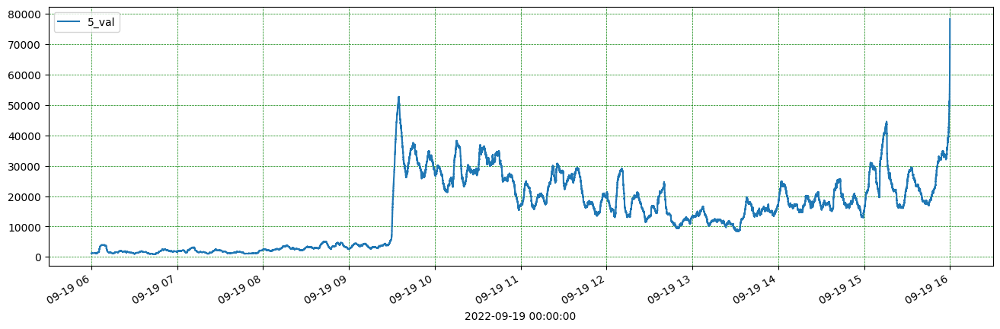

In [162]:
es3["2022-09-19 06:00:00":"2022-09-19 16:00:00"].plot( y='5_val' , figsize=(16,5))    # Interesting: Vol over 5T ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5) 

<AxesSubplot: xlabel='2022-09-19 00:00:00'>

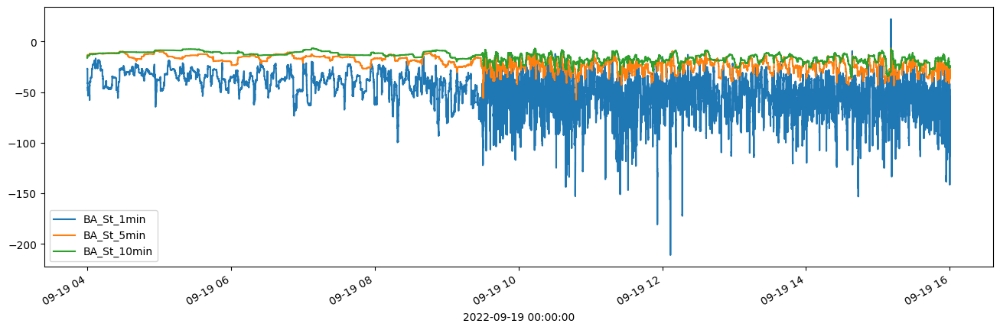

In [165]:
es3["2022-09-19 04:00:00":"2022-09-19 16:00:00"].plot( y=['BA_St_1min',	'BA_St_5min', 'BA_St_10min'], figsize=(16,5))    # Interesting BA 20 min 

<AxesSubplot: xlabel='2022-09-19 00:00:00'>

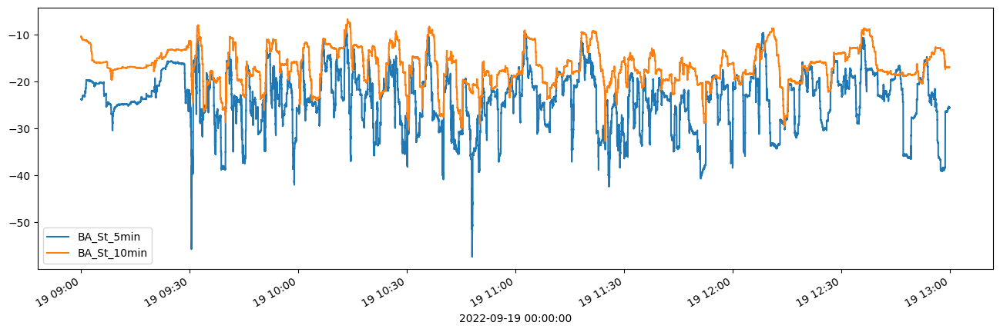

In [167]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y=['BA_St_5min', 'BA_St_10min'], figsize=(16,5))    # Interesting BA

Very Interesting derivative 

In [164]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum'],
      dtype='object')

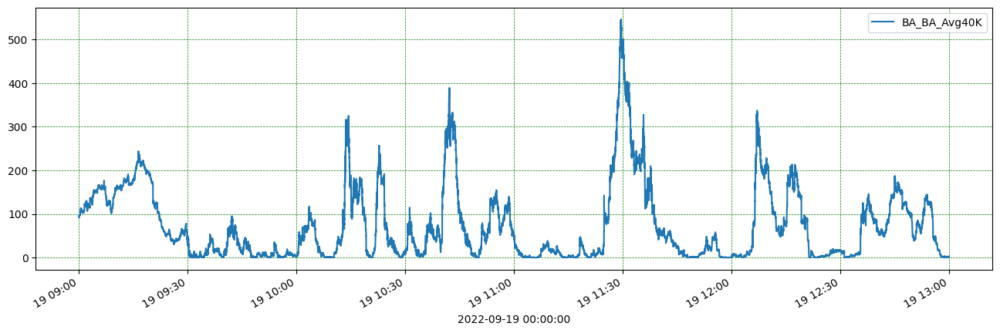

In [169]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='BA_BA_Avg40K' , figsize=(16,5))    # Very Interesting: BidAsk var * BA sum * BA mean ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5) 

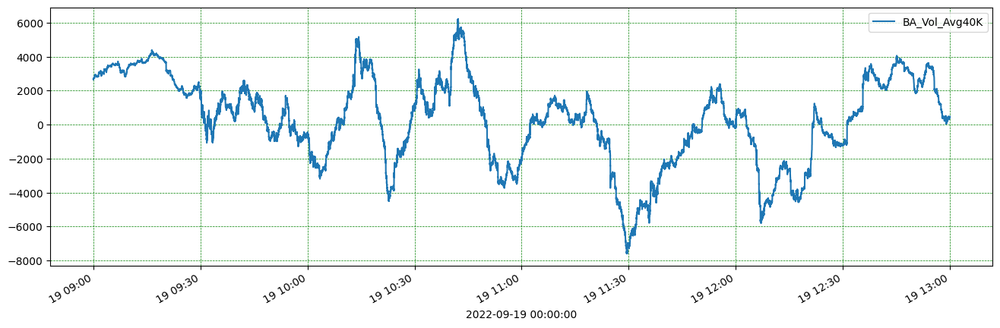

In [170]:

es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='BA_Vol_Avg40K' , figsize=(16,5))    # Very Interesting: BidAsk var * BA sum * Vol mean ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)  

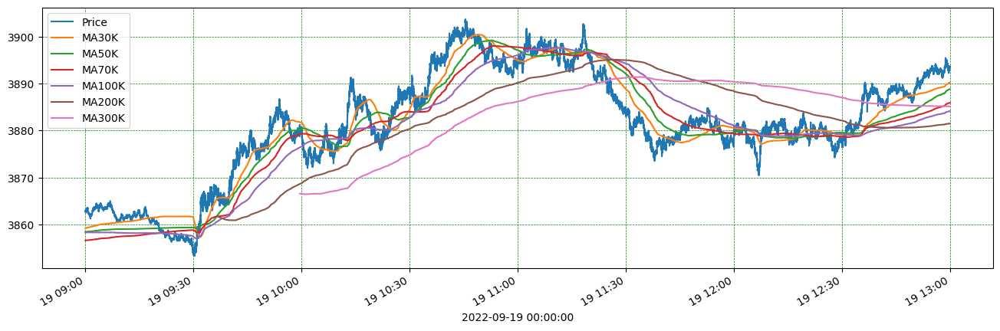

In [171]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y=['Price', 'MA30K','MA50K','MA70K', 'MA100K','MA200K','MA300K' ], figsize=(16,5))    # 6 Ma ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

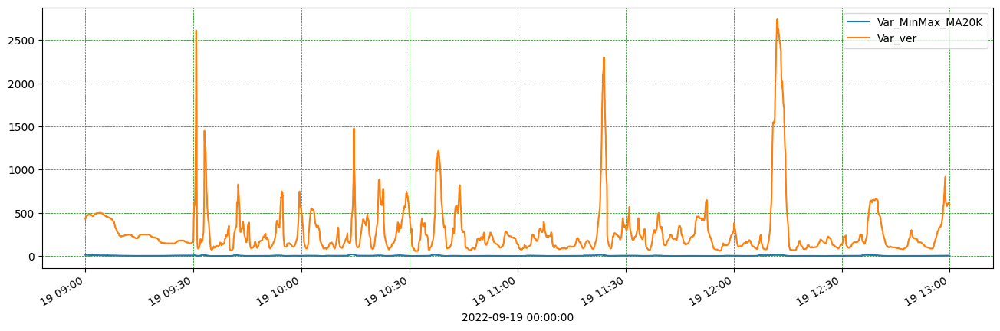

In [172]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y=['Var_MinMax_MA20K', 'Var_ver' ], figsize=(16,5))    # Interesting: 2 derived features Ma ploted over 2 hrs of the Volatile move
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

Var_MinMax_MA20K shows remarkable increases, but that is not odd considering the volatile moves. This feature is direct translation of the Variation, Min.Max over intervals. They do coincide w Price and Price is direct result of those inflections. With more modest magnitude Ver_Var also does the same. 
Try multiplying with Volume. TBD 

Since 10% of retail traders can not move the Market Index with great Volume force, Assumption is that large Spikes (Outliers) in many features are a footprint of 'BigMoney' transacting. 

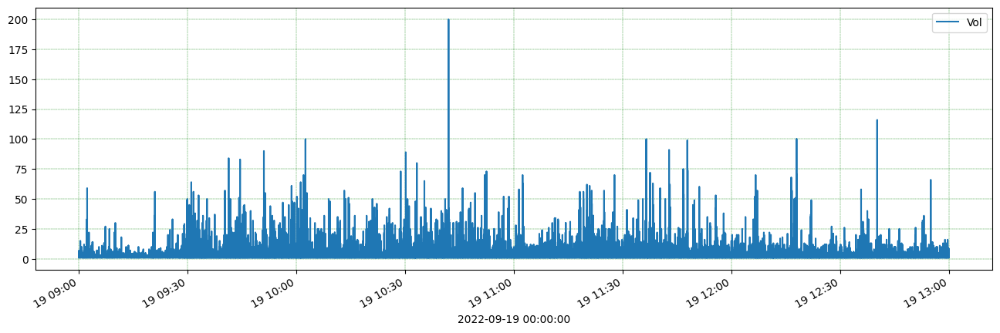

In [173]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='Vol', figsize=(16,5))  # volume througout the day
plt.grid(color = 'green', linestyle = '--', linewidth = 0.3)

Divide in 2 the most volatile rollercoaster moves during the last 2 hours: part I and II

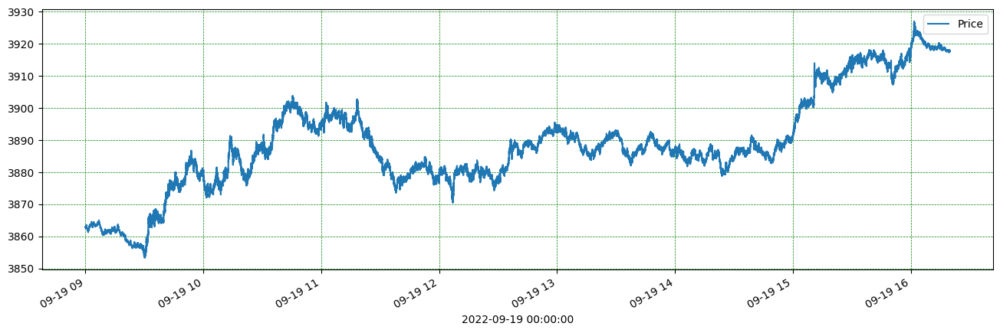

In [176]:
es3["2022-09-19 09:00:00":"2022-09-19 16:20:00"].plot( y='Price', figsize=(16,5))  # main trading day hrs
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

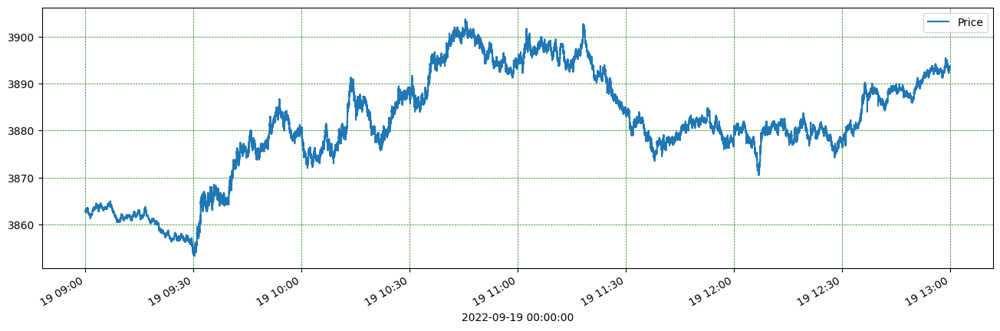

In [175]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='Price', figsize=(16,5))   # zoom on pre-lunch hrs + ,idday
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [177]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum'],
      dtype='object')

TBD: Are inflection points in the Vol_avg100 indicative of future Price changes? 

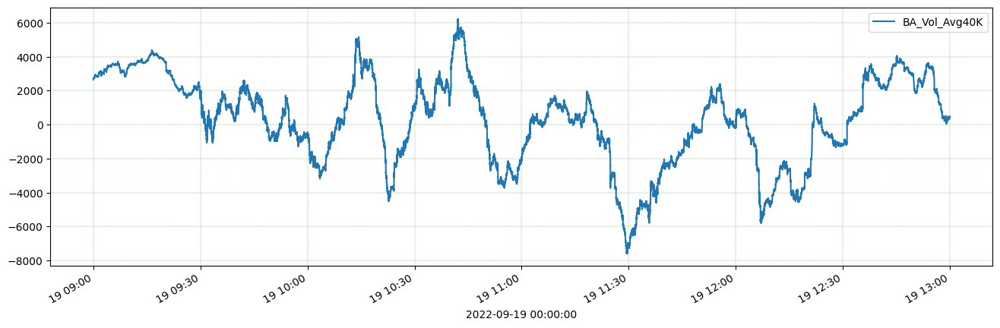

In [178]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='BA_Vol_Avg40K', figsize=(16,5)) # part I (and before) of the on BidAsk Volume mean of 40000 last ticks
plt.grid(color = 'green', linestyle = '--', linewidth = 0.2)

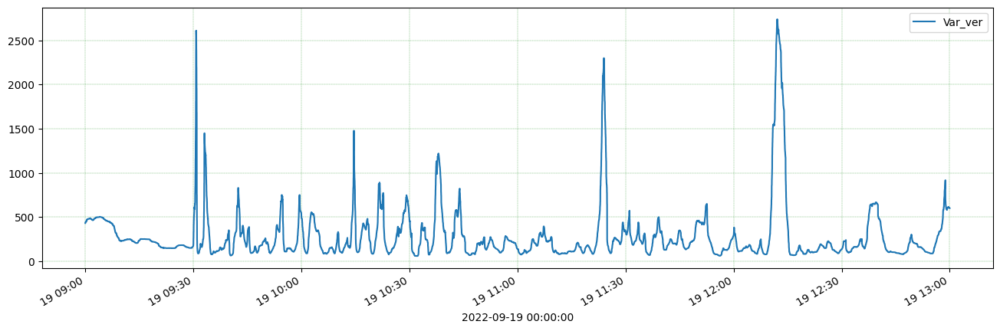

In [179]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='Var_ver', figsize=(16,5)) # part II of Volatile Move, on Price variance 20K / Price variance 20K 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.2)

In [180]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum'],
      dtype='object')

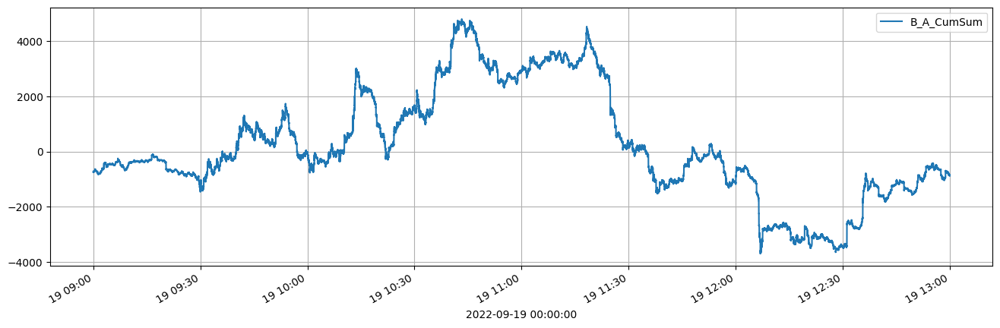

In [181]:
es3["2022-09-19 09:00:00":"2022-09-19 13:00:00"].plot( y='B_A_CumSum', figsize=(16,5)) 
plt.grid() 

<AxesSubplot: xlabel='2022-09-19 00:00:00'>

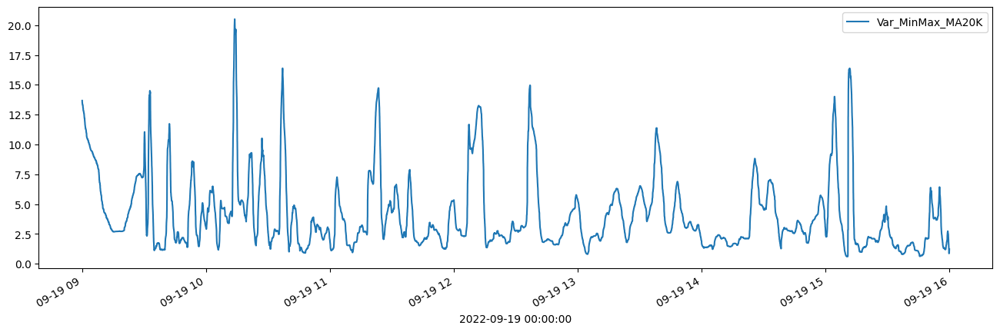

In [185]:
es3["2022-09-19 09:00:00":"2022-09-19 16:00:00"].plot( y='Var_MinMax_MA20K', figsize=(16,5)) 

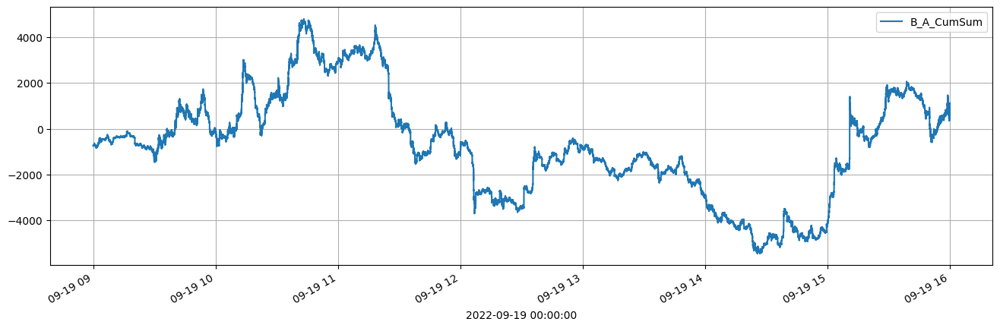

In [184]:
es3["2022-09-19 09:00:00":"2022-09-19 16:00:00"].plot( y='B_A_CumSum', figsize=(16,5))  # part II of the Volatility on last 100 ticks B_A_CumSum ratio 
# 14:40-14:45; 14:15-14:27; 15:10-15:15 there is generally steady increase of this ratio. What does Price do at that time? Seems that for short bursts of upword BA, Price advances much more, pointing to a Short Squeeze 
plt.grid()
plt.show()

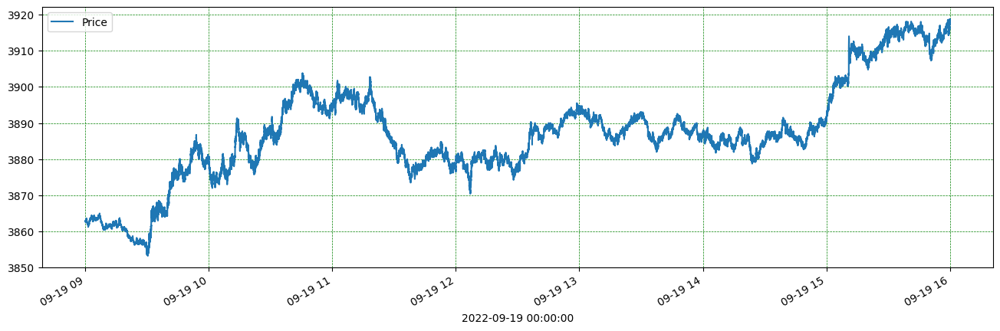

In [187]:
es3["2022-09-19 09:00:00":"2022-09-19 16:00:00"].plot( y='Price', figsize=(16,5))    #  Interesting divergence when 'B_A_CumSum' declines while Price resists adequate to BA decline- could be a sign of 
# Bying secretly while pushing Price with Selling - only to push Price after 1 hr ; or it may be interpreted: BA pushes lower 
# while Prise resists and accumulates strength for distributive push at end of day 15 hr
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)


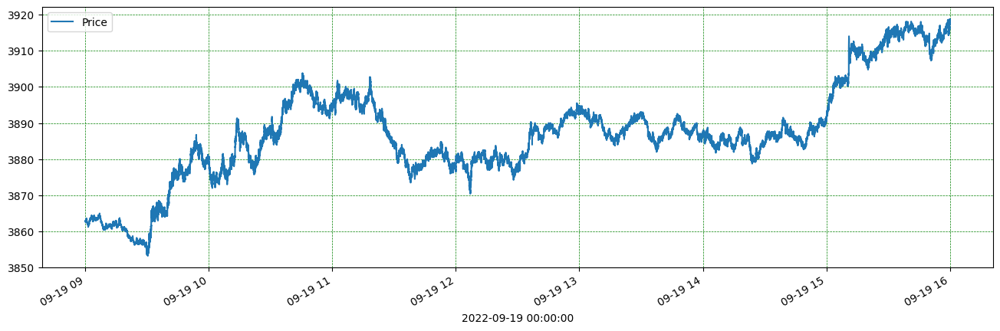

In [188]:
es3["2022-09-19 09:00:00":"2022-09-19 16:00:00"].plot( y=['Price' ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [191]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum'],
      dtype='object')

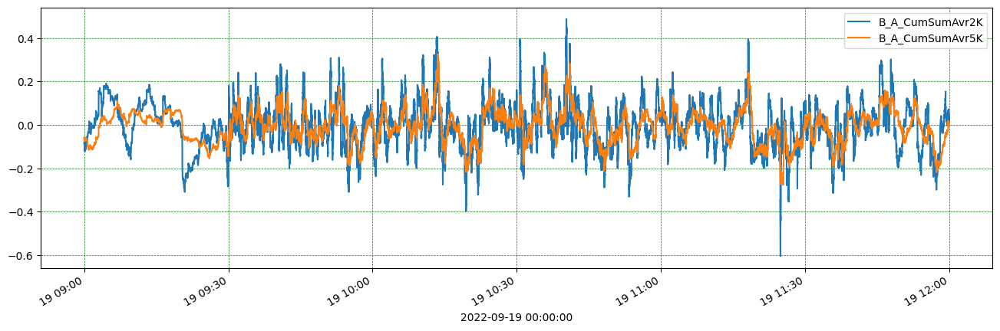

In [194]:
es3["2022-09-19 09:00:00":"2022-09-19 12:00:00"].plot( y=['B_A_CumSumAvr2K', 'B_A_CumSumAvr5K' ], figsize=(16,5))    #  BA CumSUm BA from 2 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

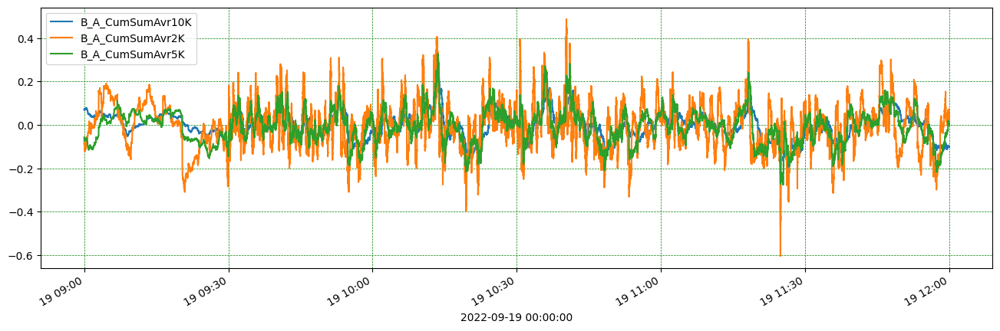

In [196]:
es3["2022-09-19 09:00:00":"2022-09-19 12:00:00"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K' ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

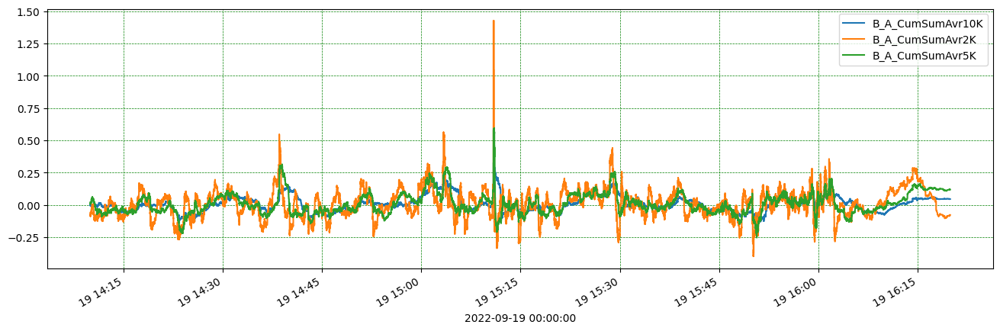

In [198]:
es3["2022-09-19 13:00":"2022-09-21 15:30"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K'  ], figsize=(16,5))    #  Averages BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

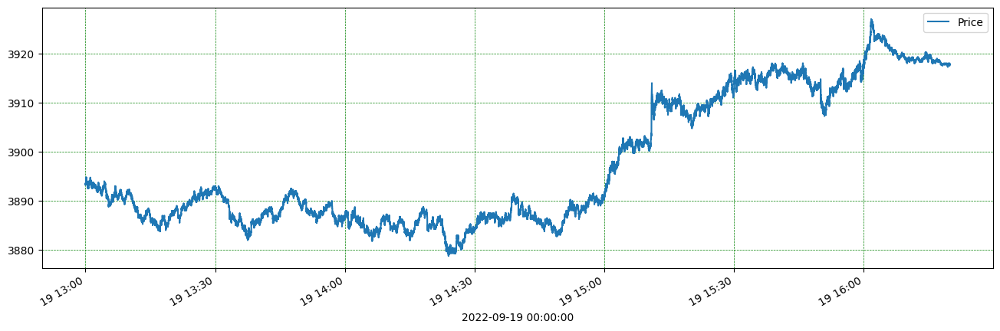

In [201]:
es3["2022-09-19 13:00":"2022-09-21 15:30"].plot( y=['Price'], figsize=(16,5))    #  30 min Zoom on few low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

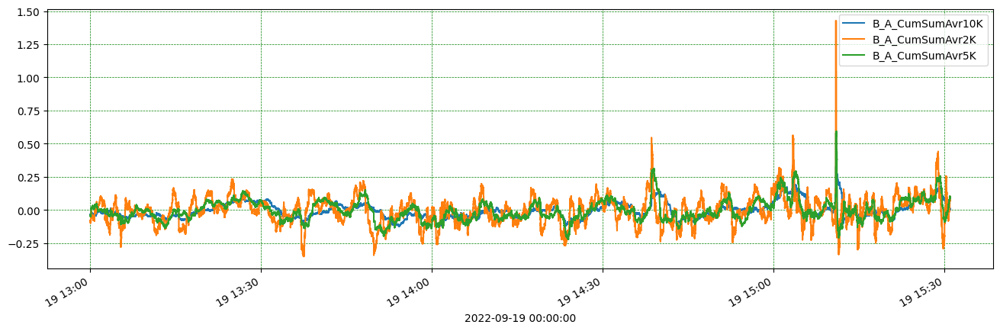

In [206]:
es3["2022-09-19 13:00":"2022-09-19 15:30"].plot( y=['B_A_CumSumAvr10K', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K' ], figsize=(16,5))    #  30 min Zoom on few low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

#### Findings: BA cycles from low to high and vs do correspond to upward/downward moves by Price. Can low of 1 cycle be Start of Upward Move (and vs.)? 

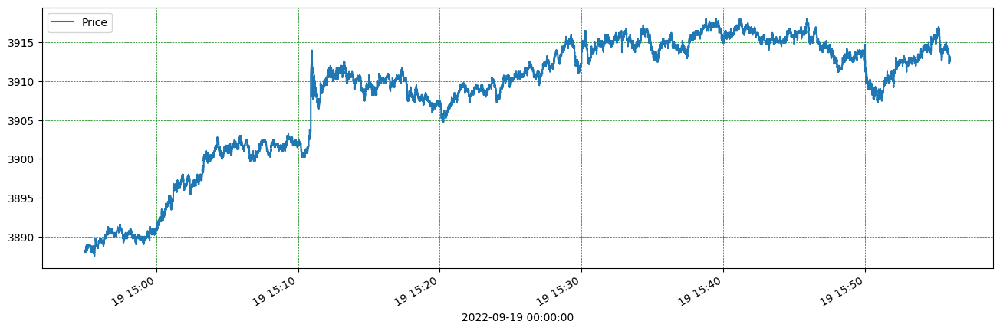

In [208]:
es3["2022-09-19 14:55":"2022-09-19 15:55"].plot( y='Price', figsize=(16,5))    #  Zoom on few 1-2 low-high cycle(s) of Price compared to higher plot cycles
# low-high cycle encompasses huge 55 pts move. At high/low of cycle (around 4-5-6) Price reverses. 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [83]:
es1.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1h', 'BA_St_1K', 'BA_St_5k', 'Prc_St_10', 'Prc_St_1h',
       'Prc_St_1k', 'MACD_3_6', 'MACD_7_12K', 'MACD_3_9', 'MACD_7_2K',
       'Shifted2K', 'Shifted30K', 'Vol_avg2h_PT', 'Vol_CumS_PT',
       'BA_CumSumPT4h', 'BA_CumSumPT1_3K', 'STD_200', 'AVG_200', 'AVG_200_Vol',
       'Price_R_BA_V', 'BA_Price_V', 'STD20K', 'MA30K', 'MA50K', 'MA70K',
       'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K', 'Var_MinMax_MA20K',
       'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val', 'Price_Target',
       'Price_Target5', 'B_A_CumSum', 'B_A_CumSumAvr2K', 'B_A_CumSumAvr4K',
       'B_A_CumSumAvr10K'],
      dtype='object')

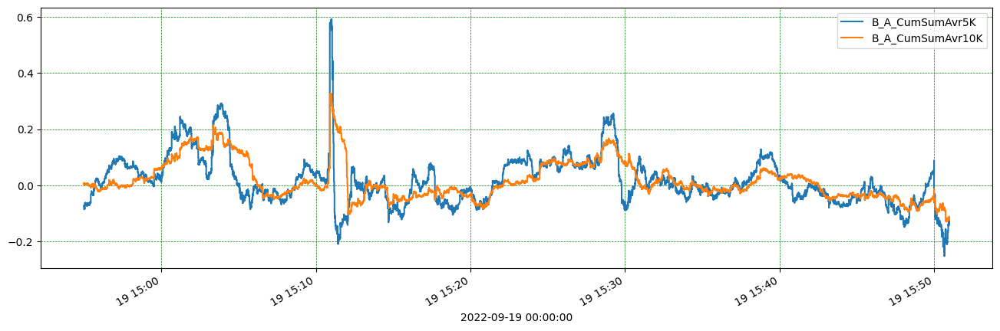

In [217]:
es3["2022-09-19 14:55":"2022-09-19 15:50"].plot( y=['B_A_CumSumAvr5K','B_A_CumSumAvr10K'], figsize=(16,5))    #  Zoom on 1-2 low-high cycle(s) of  BA from 3 timeframes
# check if Price move when heading from low to high (and opposite)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

### Conclusion: When B_A_CumSumAvr10K crosses 0 (in the high part of the cycle), Price breaks up or extends upward direction. If the retrace of B_A_CumSumAvr10K below 0 (in the low part of the cycle) is reflected with less significant Price retrace, probabilities are that Price will continue upward movement. In that sense, 0 can be deemed as a threshold for general direction gaging. The 10 has less noise then the 5 min and is preceeded by the 5. When both fall bellow 0, the move had been exhausteed and Reversal is probabilistically higher.

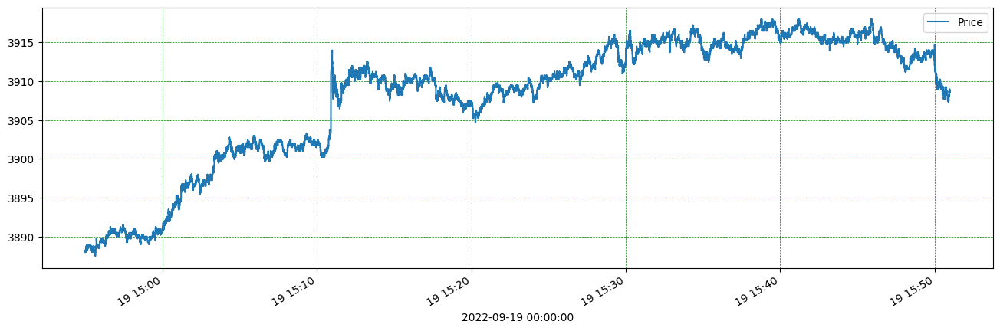

In [218]:
es3["2022-09-19 14:55":"2022-09-19 15:50"].plot( y='Price', figsize=(16,5))   
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

In [219]:
from sklearn.preprocessing import StandardScaler
import os
# from library.sb_utils import save_file
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [220]:
scaler = StandardScaler()
# scaled_tst4Corr = scaler.fit_transform(pd.DataFrame(es1[['Price', 'B_A_CumSum']]))

In [223]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K'],
      dtype='object')

In [224]:
es3['Scld_Price'] = scaler.fit_transform(pd.DataFrame(es3['Price']))
es3['Scaled_B_A_CmSm'] = scaler.fit_transform(pd.DataFrame(es3['B_A_CumSum']))
es3['Scld_CumSumAvr10K'] = scaler.fit_transform(pd.DataFrame(es3['B_A_CumSumAvr10K']))
es3['Scld_B_A_CumSumAvr5K'] = scaler.fit_transform(pd.DataFrame(es3['B_A_CumSumAvr5K']))

In [225]:
es3.shape #   (1321251, 53)
# del es1['Scld_B_A_CumSumAvr4K']
# del es1['Scld_CumSumAvr10K']
# del es1['Scaled_B_A_CmSm']
# del es1['Scld_Price']

(1321251, 53)

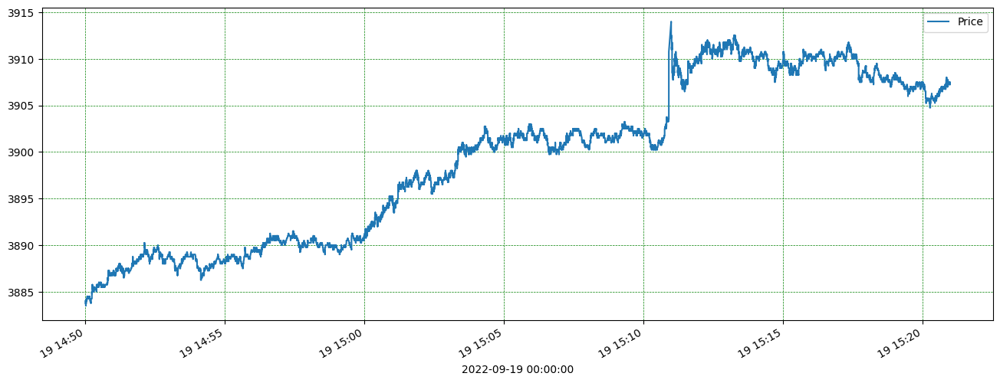

In [226]:
es3["2022-09-19 14:50":"2022-09-19 15:20"].plot( y=['Price'], figsize=(16,6))    # Interesting: 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

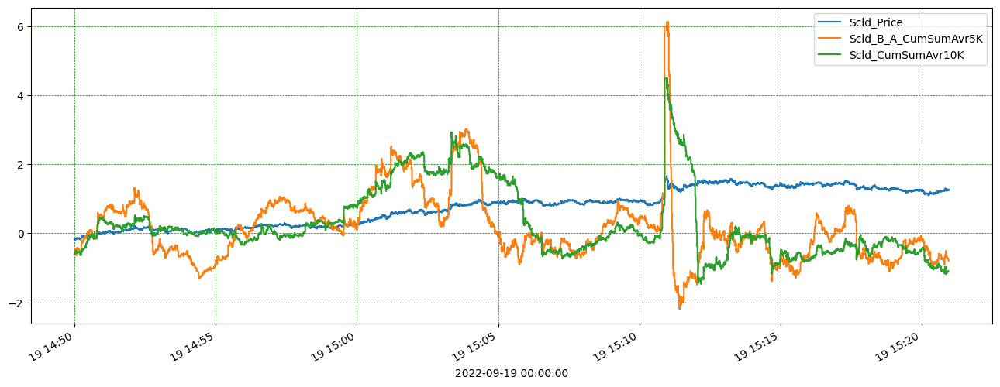

In [228]:
es3["2022-09-19 14:50":"2022-09-19 15:20"].plot( y=['Scld_Price' ,'Scld_B_A_CumSumAvr5K', 'Scld_CumSumAvr10K'], figsize=(16,6))    # Interesting: 30 min Zoomed part II of the most Volatile move
# of 2 scaled features, including scaled Price; Cyclicity at extremes, including Divergence at extremes points at potential direction of Price within the Cycle, 
# Tranistion below/above 0 also points at a Direction. What happens when Price can not follow extremes of Cycle? Exhaustion of Cycle may be the answer with Reversal folowing.
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

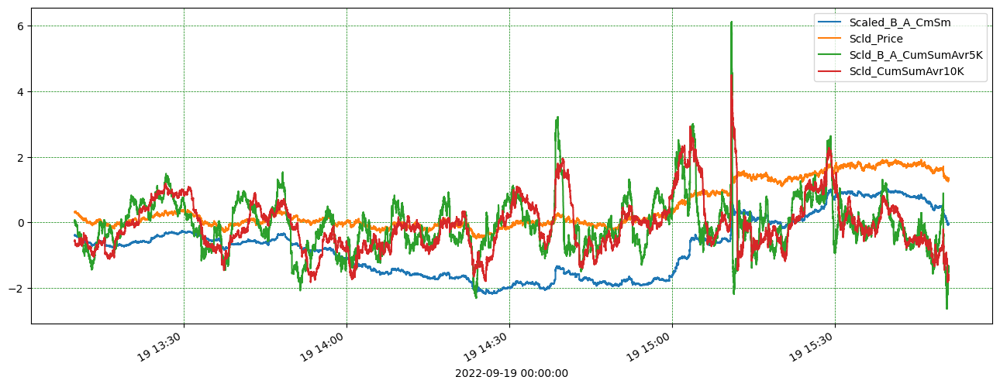

In [229]:
es3["2022-09-19 13:10":"2022-09-19 15:50"].plot( y=['Scaled_B_A_CmSm','Scld_Price' ,'Scld_B_A_CumSumAvr5K', 'Scld_CumSumAvr10K'], figsize=(16,6))    # Interesting: part II of the most Volatile move
# of 4 scaled features, including scaled Price, 
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

Findings: Movement below 0 of the cumulative BidAsk ratio, forces Price downward, while above 0 upward. 

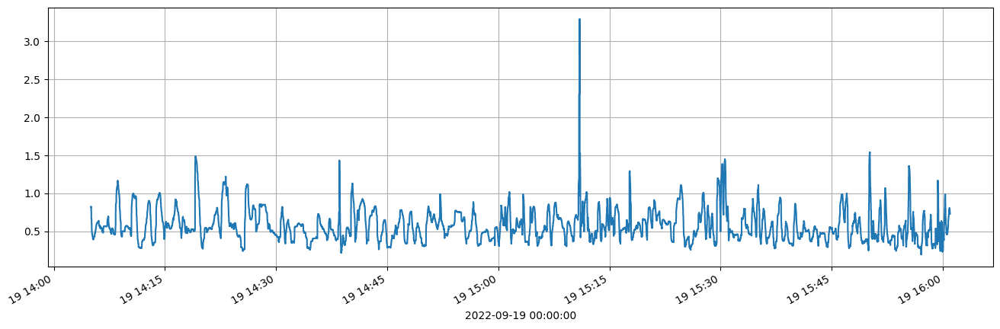

In [233]:
es3["2022-09-19 14:05":"2022-09-19 16:00"]['Price_R_BA_V'].plot( y='Price', figsize=(16,5)) # plot of  200 rows calc of Price * STD / mean  ratio
plt.grid()  #   Cyclicity is interesting

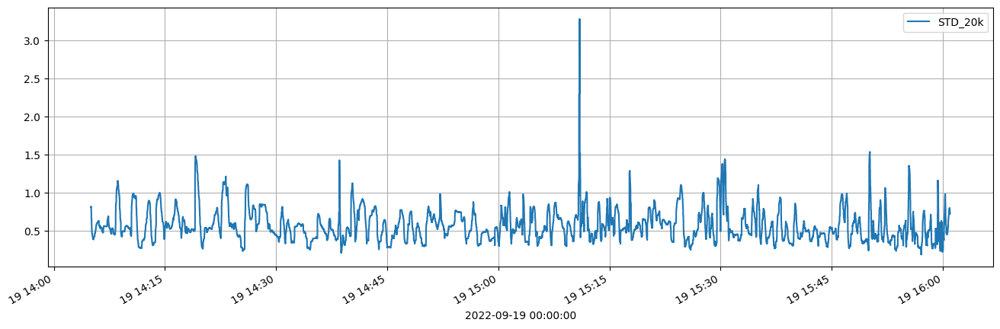

In [236]:
es3["2022-09-19 14:05":"2022-09-19 16:00"].plot( y=['STD_20k'], figsize=(16,5)) # plot of STD_20k
plt.grid()

<AxesSubplot: xlabel='2022-09-19 00:00:00'>

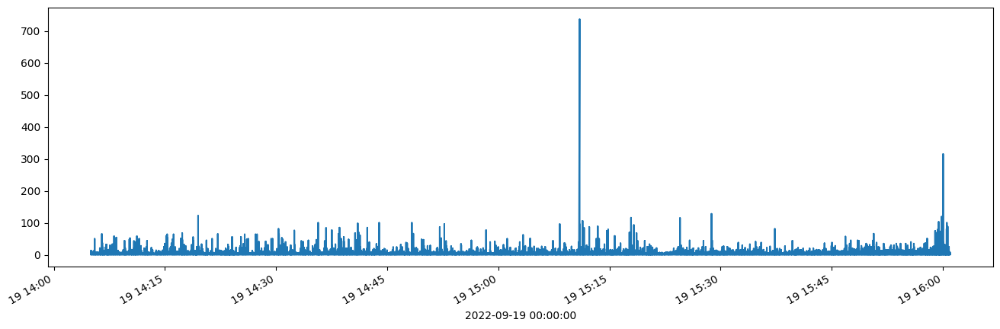

In [237]:
es3["2022-09-19 14:05":"2022-09-19 16:00"]['Vol'].plot( figsize=(16,5))

<AxesSubplot: xlabel='2022-09-19 00:00:00'>

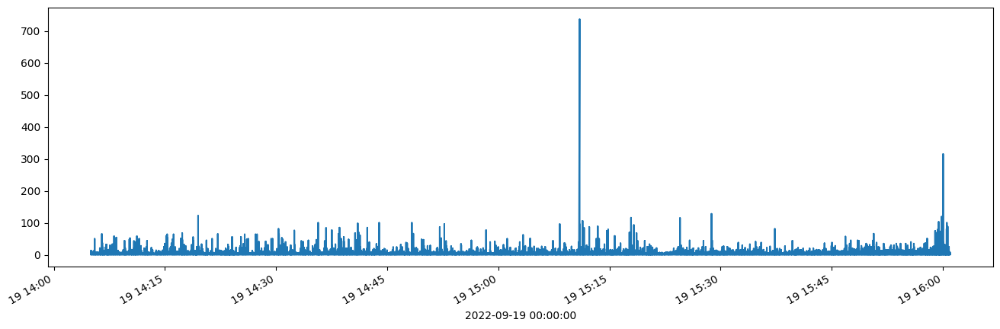

In [238]:
es3["2022-09-19 14:05":"2022-09-19 16:00"]['Vol'].plot( figsize=(16,5))

In [239]:
es3.to_csv('ES_Aug21_drv4.csv')

Possible lead: Spikes at Times after which 5-10 min later, great Volatility follows upward or downward. Of course, its common greater Volatility to be correlated with greater Volume, since that Volume fluctuation creates the Volatility. But can the Volume Spikes ahead (2-10 min) relate to or predict a possible Change? Can it be translated as: 'parking' the funds in a range or Accumulation for a possible distribution later? 

What is the story with Vol in the preceeding times? Can a period of preparation be deduced to exist with specific changes happenning ahead of a move?

In [ ]:
# for future use...
# val_5 = es.rolling('5T').Vol.sum() # (1814632,) 
# val_5.shape  # (1814632,)
# val_5.max()


### PCA

In [240]:
es3.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,Scld_Price,Scaled_B_A_CmSm,Scld_CumSumAvr10K,Scld_B_A_CumSumAvr5K
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-19 15:34:14,1,-1,3916.25,162.0,134.0,79.0,-137.0,-33.819110,-36.373968,-23.575691,46.512987,51.201190,59.201587,0.0,0.0,3915.00,3914.50,248.0,-62.0,124.0,0.0,-403.0125,-31221.00,-4.89300,-0.377861,0.0395,-0.0274,-0.0065,0.622992,3914.974750,1.4655,0.623195,-3916.25,1.151133,3913.746292,3911.596115,3911.219843,3909.137012,3898.408432,3894.558864,0.005055,1.323161,314.850007,3873.126207,156.261642,26947.0,3914.00,3907.25,1631,1.801419,0.885388,-0.112832,-0.300315
2022-09-19 12:13:46,1,-1,3880.25,-65.0,-117.0,-27.0,-28.0,-48.777245,-28.723210,-21.377437,57.277778,58.403061,58.621053,0.0,0.0,3881.25,3878.50,120.0,164.0,-60.0,0.0,-298.4625,-33516.00,9.42200,0.561039,-0.0135,-0.0056,0.0083,0.545602,3881.520875,1.3265,0.545424,-3880.25,3.299212,3877.916942,3878.495535,3879.405761,3878.808985,3885.269923,3889.255761,0.001852,10.851160,1806.523164,-2544.170057,68.831218,14643.0,3880.25,3877.00,-2692,-0.399210,-0.987179,0.091541,-0.074411
2022-09-19 09:53:01,5,1,3884.50,112.0,161.0,425.0,736.0,-33.019259,-19.080759,-11.595507,60.792857,48.362585,48.931933,0.0,0.0,3883.25,3876.00,1061.0,465.0,429.0,0.0,-413.6000,-52190.25,-4.89375,0.470196,0.2125,0.1472,0.1074,0.591632,3883.230875,1.5040,0.591825,776.90,2.780833,3878.226608,3877.153955,3874.763704,3872.036460,3865.079006,NaN,0.008564,7.711633,349.647561,576.892124,4.082201,27077.0,3881.25,3866.50,1305,-0.139413,0.744176,1.460013,1.508989
2022-09-19 13:39:44,1,-1,3886.00,35.0,13.0,98.0,284.0,-60.749165,-27.010212,-19.204264,56.081633,50.347899,53.994720,0.0,0.0,3885.25,3887.25,-437.0,-370.0,-31.0,0.0,-253.4875,-50349.75,7.71200,-0.499145,0.0490,0.0568,-0.0256,0.371869,3885.554500,1.4485,0.371911,-3886.00,3.084105,3887.916808,3887.667325,3888.985368,3889.073177,3884.611341,3883.499603,0.002302,9.484827,591.829374,-173.571652,0.299866,17586.0,3885.25,3889.25,-1928,-0.047720,-0.656242,-0.376584,0.572213
2022-09-19 15:31:00,1,1,3914.25,66.0,78.0,222.0,469.0,-47.855305,-19.637377,-18.986038,58.678571,48.656494,51.106169,0.0,0.0,3913.75,3912.50,989.0,70.0,172.0,0.0,-414.9750,-57189.00,-7.19100,0.724945,0.1110,0.0938,0.0029,0.795876,3913.719000,1.5090,0.795984,3914.25,1.606722,3911.692883,3910.495085,3910.407350,3907.441280,3896.944731,3893.681053,0.006557,2.576943,158.516282,2751.852230,75.916603,27018.0,3915.75,3900.25,1692,1.679162,0.911811,0.016973,0.955628
2022-09-19 11:07:36,1,-1,3897.25,-92.0,41.0,-83.0,106.0,-37.169184,-25.228118,-20.114961,49.370130,50.300893,45.655782,0.0,0.0,3898.75,3899.50,89.0,224.0,-3.0,0.0,-367.2625,-36420.00,-10.81600,-0.295213,-0.0415,0.0212,0.0104,0.709287,3898.017875,1.3355,0.709147,-3897.25,1.678573,3896.595892,3895.982350,3897.008100,3897.521970,3891.672705,3887.836183,0.001823,2.810746,294.918693,1148.764193,17.257656,18365.0,3897.00,3901.75,3328,0.639976,1.620466,0.120540,0.203306
2022-09-19 15:38:50,5,1,3916.75,91.0,233.0,320.0,519.0,-43.782396,-19.641354,-18.720233,57.133929,48.295714,46.273052,0.0,0.0,3917.00,3916.25,383.0,533.0,333.0,0.0,-366.8750,-51455.00,-10.04500,0.499939,0.1600,0.1038,0.0538,0.610401,3916.847000,1.4675,0.610386,783.35,1.110970,3914.838650,3913.586425,3912.131825,3911.049480,3900.692366,3895.748736,0.003255,1.232521,89.571414,2577.672973,68.277596,22410.0,3914.75,3911.00,2009,1.831984,1.049124,0.719851,1.059254
2022-09-19 06:48:34,1,1,3856.25,133.0,312.0,589.0,931.0,-31.521365,-11.574465,-11.

In [241]:
# Create a new dataframe, `es__scale` from `es1` 
es__scale = es3.copy()
# Save the labels (using the index attribute of `es1`) into the variable 'es_index'
es_index = es3.index
# # Save the column names (using the `columns` attribute) of `es1` into the variable 'es_columns'
es_columns = es3.columns


In [242]:
es__scale.shape  # (1321251, 53)

(1321251, 53)

In [243]:
es__scale.head(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,Scld_Price,Scaled_B_A_CmSm,Scld_CumSumAvr10K,Scld_B_A_CumSumAvr5K
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-19 00:00:02,1,1,3882.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3882.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1,-0.276952,0.179331,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,0,-0.292235,0.178898,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,-1,-0.292235,0.178465,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,-2,-0.292235,0.178032,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,-3,-0.292235,0.177598,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,-4,-0.292235,0.177165,NaN,NaN
2022-09-19 00:00:03,1,-1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,-5,-0.292235,0.176732,NaN,NaN
2022-09-19 00:00:04,1,1,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3882.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,-4,-0.292235,0.177165,NaN,NaN
2022-09-19 00:00:05,1,1,3882.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3882.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,NaN,-3,-0.276952,0.177598,NaN,NaN


In [244]:
es__scale = es__scale.fillna(0)
es__scale = es__scale[np.isfinite(es__scale).all(1)]  # to get rid of Infinite values 

In [245]:
es__scale.shape  #    (1321251, 53)

(1321251, 53)

In [247]:
es__scale.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,Scld_Price,Scaled_B_A_CmSm,Scld_CumSumAvr10K,Scld_B_A_CumSumAvr5K
2022-09-19 00:00:00,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-09-19 13:01:26,1,1,3893.00,-48.0,82.0,55.0,-35.0,-39.890353,-23.243950,-25.356342,50.142857,56.122689,44.746639,0.0,0.0,3893.75,3892.00,-27.0,166.0,132.0,0.0,-352.0125,-47213.25,1.9325,0.023041,0.0275,-0.0070,-0.0118,0.495669,3893.494625,1.5645,0.495606,3893.000000,1.758999,3890.922875,3889.436335,3886.500093,3884.499725,3881.651734,3885.099239,0.007703,3.086929,362.336665,540.125100,3.196116,13576.0,3892.25,3879.25,-773,0.380180,-0.155938,-0.186020,-0.088919
2022-09-19 15:29:31,1,1,3912.75,-138.0,-269.0,-204.0,656.0,-37.046053,-22.249832,-15.176787,54.331633,55.792857,47.891484,0.0,0.0,3915.00,3909.50,1507.0,895.0,-392.0,0.0,-538.8250,-49023.00,-5.3270,0.065224,-0.1020,0.1312,0.1099,0.871586,3914.645125,1.5395,0.871164,3912.750000,2.152744,3910.223792,3910.122085,3909.335029,3906.044458,3895.982915,3893.054670,0.009116,4.623954,197.345121,2768.353680,77.401402,22735.0,3912.00,3901.75,1522,1.587469,0.838173,1.494536,1.343188
2022-09-19 15:11:58,1,-1,3909.75,8.0,-63.0,32.0,-591.0,-43.724906,-32.353865,-9.456301,59.907143,51.347899,50.766234,0.0,0.0,3908.50,3902.50,1856.0,-901.0,111.0,0.0,-562.5000,-44178.75,-1.0800,-0.024573,0.0160,-0.1182,0.1216,1.000483,3908.663375,1.5000,1.000761,-3909.750000,4.037445,3904.115892,3900.347555,3896.527800,3893.771585,3889.734496,3889.534759,0.016115,16.241610,511.454723,7637.324426,420.073921,32354.0,3912.50,3886.50,288,1.404084,0.303649,1.656101,-1.241237
2022-09-19 07:36:32,1,-1,3856.50,121.0,60.0,-96.0,-214.0,-33.054065,-15.190299,-13.054888,44.604396,47.254378,45.130556,0.0,0.0,3854.50,3857.00,670.0,-55.0,136.0,0.0,-444.5000,-68300.75,10.4520,-6.005024,-0.0480,-0.0428,0.0248,0.880036,3855.590750,1.2700,0.880244,-3856.500000,2.727599,3854.703550,3856.488760,3858.760311,0.000000,0.000000,0.000000,0.000000,7.415242,154.810854,1504.587934,28.165022,1277.0,3861.25,3871.00,-2613,-1.851013,-0.952959,0.319390,-0.459899
2022-09-19 13:11:29,1,1,3889.00,-137.0,-192.0,-335.0,-255.0,-43.150550,-24.243461,-19.981519,42.880952,54.702381,45.578896,0.0,0.0,3889.75,3892.75,-571.0,-317.0,-239.0,0.0,-616.3125,-46341.00,6.1200,0.050988,-0.1675,-0.0510,-0.0398,1.143646,3890.364875,1.6435,1.143245,3889.000000,1.451955,3892.157292,3890.790885,3889.645946,3886.448150,3882.851421,3884.733500,0.007848,2.104790,207.555582,-475.894162,2.332309,10270.0,3890.25,3877.50,-1632,0.135666,-0.528025,-0.572671,-0.544872
2022-09-19 09:53:46,3,-1,3884.75,88.0,76.0,-177.0,362.0,-36.388292,-29.037524,-11.063423,44.558442,55.556122,65.802976,0.0,0.0,3883.25,3876.25,1079.0,465.0,9.0,0.0,-388.7125,-35640.50,-3.3935,-0.141806,-0.0885,0.0724,0.0631,0.690381,3883.662750,1.4135,0.690574,-1294.916667,2.861604,3878.944675,3877.830085,3875.723557,3872.715003,3865.706860,0.000000,0.009319,8.168753,344.664900,692.006301,5.867317,28739.0,3880.75,3867.25,1234,-0.124131,0.713422,0.848274,0.733869
2022-09-19 15:47:25,1,-1,3914.00,39.0,-43.0,-117.0,-454.0,-72.047721,-26.130051,-25.902587,45.738095,43.062185,41.760924,0.0,0.0,3914.50,3916.50,-739.0,-306.0,11.0,0.0,-232.8750,-44446.50,-3.2630,0.078921,-0.0585,-0.0908,-0.0426,0.302726,3914.365500,1.5525,0.302698,-3914.000000,0.909584,3915.769308,3915.391460,3914.443800,3912.794890,3904.073763,3897.896813,0.002546,0.826446,93.123254,-1075.009784,12.480076,20347.0,3916.00,3908.50,1004,1.663880,0.613794,-0.611337,-0.957302
2022-09-19 13:02:26,1,-1,3893.00,14.0,-16.0,

In [248]:
import os
# from library.sb_utils import save_file
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [249]:
scaler1 = StandardScaler()
es__scaled = scaler1.fit_transform(es__scale)

In [250]:
es_scaled_df = pd.DataFrame(es__scaled, columns= es_columns)
es_scaled_df.sample(9)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,Scld_Price,Scaled_B_A_CmSm,Scld_CumSumAvr10K,Scld_B_A_CumSumAvr5K
421460,-0.247795,0.948164,0.043973,0.082707,-0.653285,-0.395321,-0.049573,-0.238270,-1.598564,-0.343102,1.218800,0.998221,0.578574,0.0,0.0,0.022494,0.099217,0.415816,0.114803,-0.566296,0.0,0.876465,1.159303,-0.637032,0.105642,-0.395321,-0.049573,0.281968,-0.772759,0.045195,-0.400462,-0.772882,1.039303,0.205364,0.146784,0.193229,0.233813,0.282221,0.417869,0.534725,0.005809,0.001673,1.639907,0.000649,-0.663670,0.503132,0.085941,0.248620,0.789225,0.043973,0.789225,0.281793,-0.049635
880552,-0.247795,-0.951347,-0.093567,-0.097512,0.151321,0.609365,-0.327817,0.230968,0.057576,0.667135,1.283496,-0.892497,-1.362692,0.0,0.0,0.016995,0.116793,-0.788835,-0.278564,0.368548,0.0,0.774346,0.172868,0.438011,0.160168,0.609365,-0.327817,-0.265562,-0.543505,0.033596,-0.101114,-0.543852,-1.039908,0.492969,0.157427,0.203693,0.240300,0.287010,0.420210,0.540771,0.268465,0.275536,1.396489,-1.007833,-0.041785,-0.807600,0.076833,0.252397,-0.679632,-0.093567,-0.679632,-0.265738,-0.327879
144562,-0.247795,-0.951347,-1.835731,-0.358830,-0.348684,-0.358519,-0.909221,0.317896,1.025560,0.623434,-0.391563,0.483282,1.273539,0.0,0.0,-0.293717,0.043347,-0.039657,-0.699178,-0.510761,0.0,0.088049,-0.863012,0.379918,-0.158116,-0.358519,-0.909221,-0.487347,-0.013384,-0.152293,-0.206766,-0.013969,-1.032284,0.392993,0.109490,0.161717,0.204497,0.258545,-2.367692,-1.845023,0.161901,0.176460,-0.423906,0.723882,-0.132903,-1.428078,-0.006792,0.220292,-0.159836,-1.835731,-0.159836,-0.487523,-0.909284
916081,0.249752,0.948164,0.028691,0.731496,0.312243,0.219267,0.718712,0.512698,0.584258,-0.711405,-1.430332,-0.449634,0.608357,0.0,0.0,0.014245,0.102983,-0.435471,0.380454,0.275989,0.0,-0.175091,-0.406225,0.589339,-0.071028,0.219267,0.718712,-0.339028,-0.904492,0.032375,0.974977,-0.904021,0.519316,0.837515,0.154720,0.199825,0.239384,0.288781,0.421139,0.540242,-0.610111,0.641028,0.894501,0.022133,-0.661894,-0.397072,0.069382,0.259951,-0.630685,0.028691,-0.630685,-0.339204,0.718650
570808,0.249752,-0.951347,0.716387,0.947759,0.852478,0.881698,0.077090,0.845991,-0.262044,-0.865079,-1.116159,0.487923,0.405003,0.0,0.0,0.140729,0.131232,0.501862,0.392374,0.738784,0.0,-0.365645,0.711886,-1.742985,0.141221,0.881698,0.077090,0.313849,0.598512,0.104990,-0.656767,0.599737,-0.522028,-1.123852,0.171197,0.211340,0.248294,0.297155,0.426475,0.543146,-0.739559,-0.884072,-0.561926,0.404029,-0.469568,-0.428514,0.112436,0.270743,1.728324,0.716387,1.728324,0.313674,0.077028
991867,-0.247795,0.948164,-0.139413,-0.295753,0.024883,-1.271201,-0.437868,-0.166737,0.439764,0.210493,-1.142037,0.693987,0.153184,0.0,0.0,0.000497,0.101100,-0.304680,0.126723,-0.621832,0.0,-2.259681,-0.640233,1.967013,-0.192724,-1.271201,-0.437868,-0.138036,1.854972,0.029378,0.656063,1.854116,1.038500,-0.639282,0.149747,0.197274,0.236784,0.286626,0.423293,0.541063,-0.771408,-0.633091,-0.701661,-1.029281,-0.181457,-0.193086,0.070209,0.251588,-1.693668,-0.139413,-1.693668,-0.138212,-0.437931
403245,-0.247795,-0.951347,-0.338081,-0.656191,0.530636,2.004150,1.534754,-0.177812,0.265601,0.036421,1.489583,-0.227210,-0.380343,0.0,0.0,-0.029750,0.084151,0.223072,1.654215,0.956297,0.0,-0.175508,0.544108,-0.551555,0.210034,2.004150,1.534754,1.322968,0.035789,0.005995,-0.600028,0.035461,-1.038838,-0.628743,0.141950,0.193981,0.231721,0.280190,0.416733,0.533652,0.224832,-0.626746,-0.628444,-0.924993,-0.024564,0.549675,0.047854,0.244034,0.523263,-0.338081,0.523263,1.322795,1.534693

In [251]:
es_scaled_df.mean()

Vol                    -2.650181e-17
BidAsk                  2.209201e-17
Price                   8.076513e-15
BA_5h                  -7.744036e-18
BA_1K                   2.632972e-17
BA_2K                  -1.686479e-17
BA_5K                   1.583225e-17
BA_St_1min             -8.732691e-16
BA_St_5min             -1.132350e-15
BA_St_10min             9.917529e-16
Prc_St_1min            -1.888254e-15
Prc_St_5min            -3.814196e-15
Prc_St_10min            2.579624e-15
MACD_5min               0.000000e+00
MACD_10min              0.000000e+00
P_Shift_5Min            3.693045e-16
P_Shift_10Min           3.604419e-16
BA_10min                3.839751e-17
BA_5min                 6.883588e-18
BA_1min                 7.055677e-18
MACD_1min               0.000000e+00
Vol_avg2k_PT            2.313746e-16
Vol_CumS_PT             1.979031e-16
BA_CumSumPT4h          -8.225887e-17
BA_CumSumPT7K          -1.729501e-17
B_A_CumSumAvr2K        -1.066956e-17
B_A_CumSumAvr5K        -6.883588e-18
B

In [252]:
es_scaled_df.sample(6)

,Vol,BidAsk,Price,BA_5h,BA_1K,BA_2K,BA_5K,BA_St_1min,BA_St_5min,BA_St_10min,Prc_St_1min,Prc_St_5min,Prc_St_10min,MACD_5min,MACD_10min,P_Shift_5Min,P_Shift_10Min,BA_10min,BA_5min,BA_1min,MACD_1min,Vol_avg2k_PT,Vol_CumS_PT,BA_CumSumPT4h,BA_CumSumPT7K,B_A_CumSumAvr2K,B_A_CumSumAvr5K,B_A_CumSumAvr10K,STD_20k,AVG_20k,AVG_20k_Vol,Price_R_BA_V,BA_Price_V,STD20K,MA30K,MA50K,MA70K,MA100K,MA200K,MA300K,Var_Vol_100K,Var_MinMax_MA20K,Var_ver,BA_Vol_Avg40K,BA_BA_Avg40K,5_val,Price_Target,Price_Target5,B_A_CumSum,Scld_Price,Scaled_B_A_CmSm,Scld_CumSumAvr10K,Scld_B_A_CumSumAvr5K
821727,-0.247795,-0.951347,0.105101,0.569299,0.886961,1.036265,0.149766,1.241941,0.032209,-0.364830,0.345185,-0.525306,0.186262,0.0,0.0,0.030743,0.108633,-0.640835,-0.481208,0.831342,0.0,-1.192106,0.259017,0.477260,0.150153,1.036265,0.149766,-0.591308,1.517083,0.038392,-0.433723,1.518843,-1.040778,-0.805590,0.150189,0.193093,0.231236,0.280560,0.418224,0.541490,-0.159848,-0.728536,-0.593467,0.967336,0.172768,-0.651939,0.086769,0.248890,-0.478644,0.105101,-0.478644,-0.591485,0.149704
78211,-0.247795,1.897919,-1.973271,0.190839,0.467417,0.355434,0.594125,1.017405,1.350078,0.590993,1.032482,-0.628004,0.109661,0.0,0.0,-0.356959,0.023260,-0.584618,0.840234,0.854482,0.0,0.116248,-1.135168,3.074377,-3.116114,0.355434,0.594125,-0.594080,0.458203,-0.182649,-1.126334,0.459170,2.061554,0.693152,0.097815,0.161088,0.208392,-3.494342,-2.367692,-1.845023,-1.121920,0.481851,-0.488125,-0.936396,0.007552,-1.613013,-0.046534,-3.938512,-1.643421,-1.973271,-1.643421,-0.594257,0.594063
588458,1.244846,0.948164,0.533001,-0.620147,-0.561330,0.020538,0.407245,0.252315,0.262360,-0.295888,1.391575,-0.416224,-0.373769,0.0,0.0,0.129731,0.123071,0.025738,0.170999,-0.371923,0.0,0.656710,0.290717,-1.863176,0.419558,0.020538,0.407245,-0.118630,-0.401349,0.102381,-0.433723,-0.401814,0.259908,-0.476722,0.169546,0.212057,0.247605,0.296463,0.427303,0.543589,-0.752758,-0.530350,-0.179630,-0.085439,-0.666940,-0.336434,0.100016,0.268315,1.599241,0.533001,1.599241,-0.118806,0.407183
1138057,-0.247795,-0.951347,1.434648,0.515233,0.858225,-0.104587,-0.830316,1.039211,-1.588544,-1.352002,-1.432808,0.313906,0.454983,0.0,0.0,0.258964,0.165757,-0.762447,-0.712801,0.808203,0.0,-0.067048,0.909674,-0.167705,0.180582,-0.104587,-0.830316,-0.742399,0.211884,0.186315,0.123887,0.212547,-1.046596,-0.885310,0.191390,0.224648,0.254807,0.297044,0.426061,0.544698,3.899726,-0.770831,-0.418974,1.099090,0.082420,1.684843,0.158802,0.254825,0.125619,1.434648,0.125619,-0.742576,-0.830379
616492,-0.247795,-0.951347,0.181512,-4.098375,-3.825732,-2.677026,-1.692041,-3.348291,-1.128690,-2.551724,-0.067013,-0.094820,0.025437,0.0,0.0,0.066488,0.121815,-1.788121,-1.708991,-2.570196,0.0,-0.402188,0.576214,-1.053480,0.170852,-2.677026,-1.692041,-1.442406,-0.192205,0.065476,-0.191114,-0.192791,-1.041112,0.288164,0.167163,0.210359,0.247759,0.295275,0.428608,0.544617,-0.726405,0.077561,1.460145,-0.988924,-0.057826,0.229291,0.095877,0.263728,1.030931,0.181512,1.030931,-1.442584,-1.692104
502136,-0.247795,-0.951347,0.869209,-0.620147,-1.176279,-1.462570,-1.347351,-1.323484,-1.853277,-1.177008,0.137939,-2.362937,-0.531344,0.0,0.0,0.176475,0.140020,-0.970106,-1.312218,-0.612576,0.0,0.794370,0.911509,-0.990425,0.023163,-1.462570,-1.347351,-0.738240,-0.655253,0.130263,-0.159809,-0.655145,-1.044121,-1.235551,0.176081,0.214181,0.246544,0.292202,0.422368,0.540039,1.051061,-0.930176,-0.633686,0.623047,-0.334996,0.184064,0.133963,0.256444,1.853942,0.869209,1.853942,-0.738417,-1.347414


In [253]:
es_scaled_df.std()

Vol                     1.0
BidAsk                  1.0
Price                   1.0
BA_5h                   1.0
BA_1K                   1.0
BA_2K                   1.0
BA_5K                   1.0
BA_St_1min              1.0
BA_St_5min              1.0
BA_St_10min             1.0
Prc_St_1min             1.0
Prc_St_5min             1.0
Prc_St_10min            1.0
MACD_5min               0.0
MACD_10min              0.0
P_Shift_5Min            1.0
P_Shift_10Min           1.0
BA_10min                1.0
BA_5min                 1.0
BA_1min                 1.0
MACD_1min               0.0
Vol_avg2k_PT            1.0
Vol_CumS_PT             1.0
BA_CumSumPT4h           1.0
BA_CumSumPT7K           1.0
B_A_CumSumAvr2K         1.0
B_A_CumSumAvr5K         1.0
B_A_CumSumAvr10K        1.0
STD_20k                 1.0
AVG_20k                 1.0
AVG_20k_Vol             1.0
Price_R_BA_V            1.0
BA_Price_V              1.0
STD20K                  1.0
MA30K                   1.0
MA50K               

In [255]:
es_pca = PCA().fit(es_scaled_df)

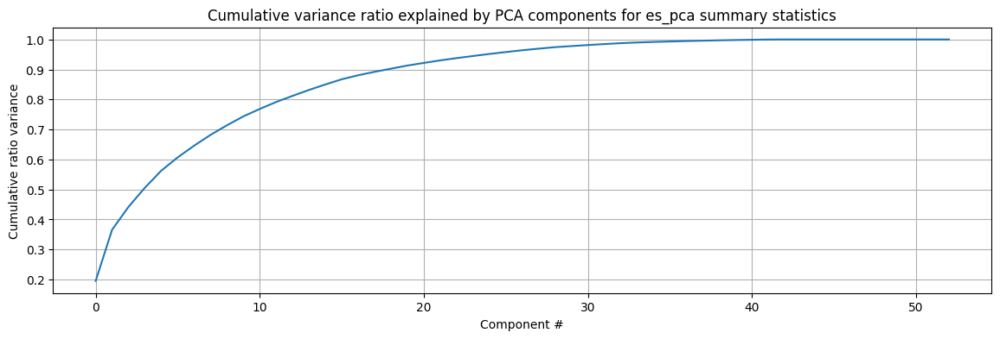

In [256]:
plt.subplots(figsize=(14, 4))
plt.plot(es_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for es_pca summary statistics')
plt.grid()

- Conclusion: Looks like 30 features account for 98% of all components. About 15 features account for 80%; 

In [257]:
es_pca_x = es_pca.transform(es__scaled)

c:\Users\tonya\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [258]:
es_pca_x.shape  # (1808952, 47)

(1321251, 53)

In [259]:
es_pca_x

array([[-1.46357973e+01,  9.19829137e+00,  2.77960401e+01, ...,
         1.04628879e-14,  1.79760720e-15, -5.08935342e-15],
       [-1.47123021e+01,  9.09799022e+00,  2.77863556e+01, ...,
         1.05437676e-14,  1.44827726e-15, -5.56217399e-15],
       [-1.47124210e+01,  9.09801260e+00,  2.77861455e+01, ...,
         1.05437796e-14,  1.44827726e-15, -5.56228241e-15],
       ...,
       [ 2.70181630e+00,  1.08114471e-01,  3.94773990e-01, ...,
        -8.13531449e-16, -7.99898265e-16,  7.29035877e-16],
       [ 2.78268030e+00,  2.15582244e-01,  4.05439652e-01, ...,
        -8.79511279e-16, -4.42804459e-16,  1.20047671e-15],
       [ 2.69297479e+00,  1.04421115e-01,  3.94283505e-01, ...,
        -8.16165139e-16, -8.03883941e-16,  7.27086032e-16]])

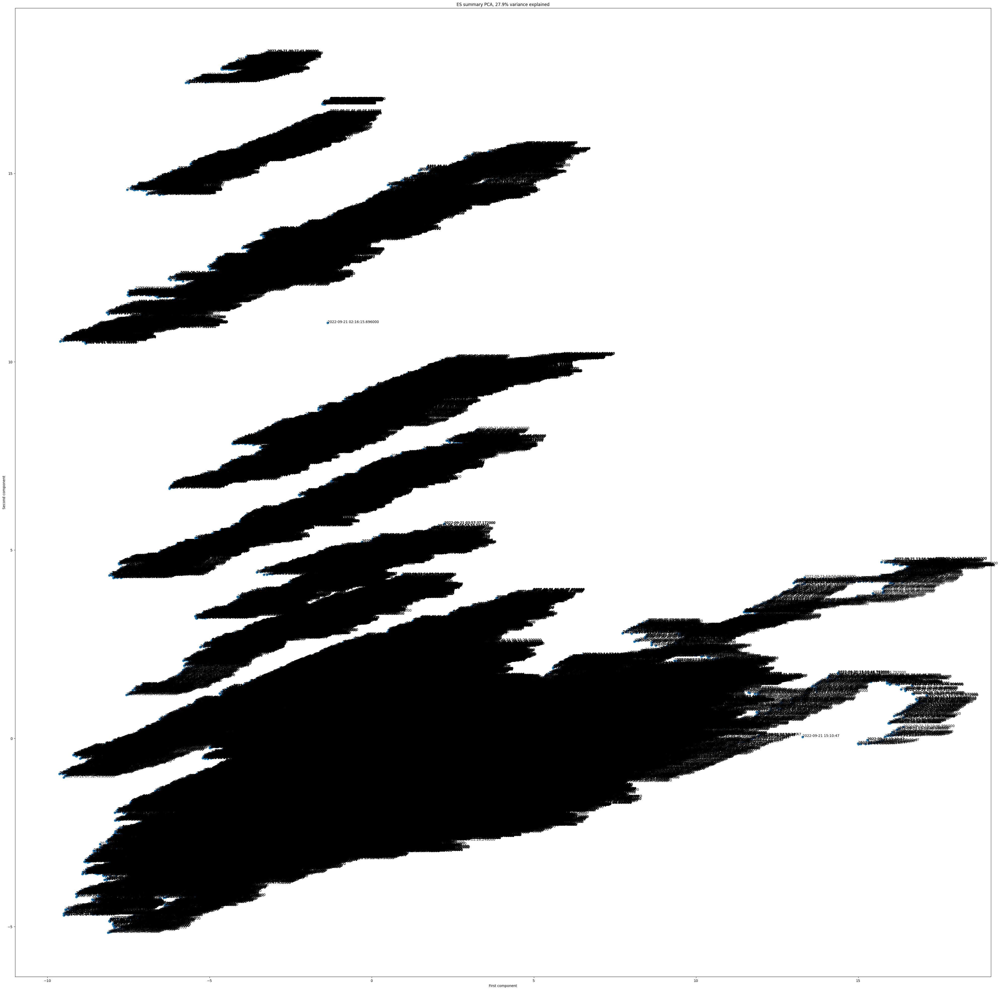

In [201]:
x = es_pca_x[:, 0]
y = es_pca_x[:, 1]
esx = es_index
pc_var = 100 * es_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(50,50))
plt.scatter(x=x, y=y)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'ES summary PCA, {pc_var:.1f}% variance explained')
for s, x, y in zip(esx, x, y):
    plt.annotate(s, (x, y))

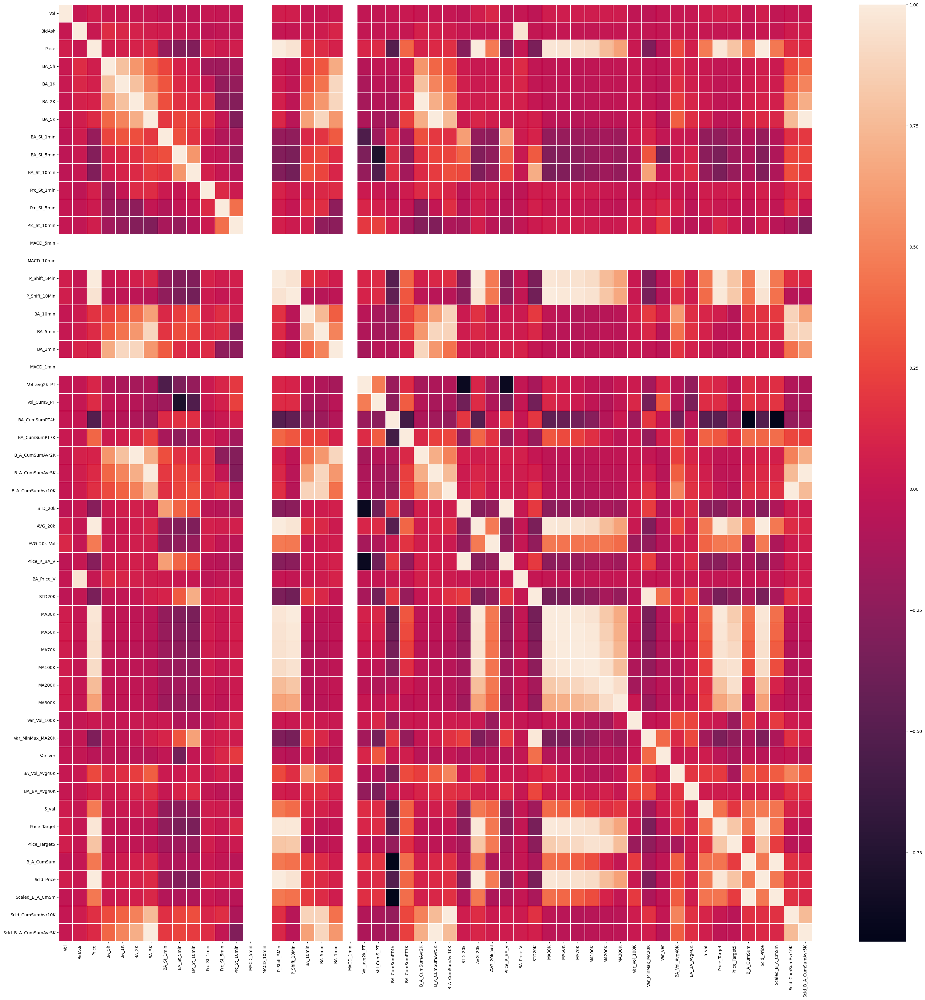

In [269]:
plt.subplots(figsize=(40,40))
sns.heatmap(es3.corr(), linewidths=.2);

In [261]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K', 'Scld_B_A_CumSumAvr5K'],
      dtype='object')

In [271]:
ar = ['Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min','BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
      
       'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       
        'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K', 'Scld_B_A_CumSumAvr5K' ]

Text(0.5, 1.0, 'Correlations in ES data')

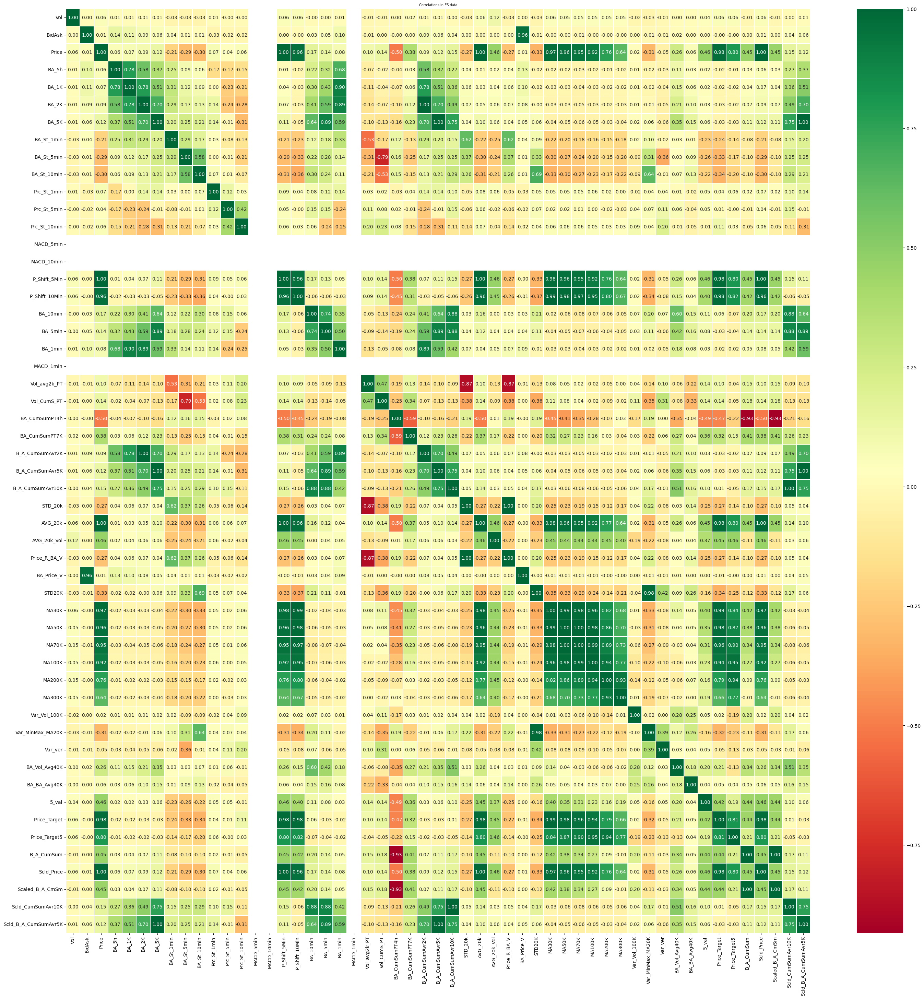

In [270]:
# seaborn heatmap of correlations in es data
plt.subplots(figsize=(35,35))
# Using numpy ‘.tril()’ method to take the upper correlation matrix and mask attribute: to create an upper triangle matrix.
#matrix = np.tril(es1.corr())
#sns.heatmap(ski_data.corr(), linewidths=.1, annot=True, cmap='coolwarm', center=0, mask=matrix);
sns.heatmap(es3.corr(), linewidths=.2, annot=True, cmap='RdYlGn', fmt='.2f')
plt.title('Correlations in ES data', fontsize=7)

In [266]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K', 'Scld_B_A_CumSumAvr5K'],
      dtype='object')

Text(0.5, 1.0, 'Correlations between Price vs. features ')

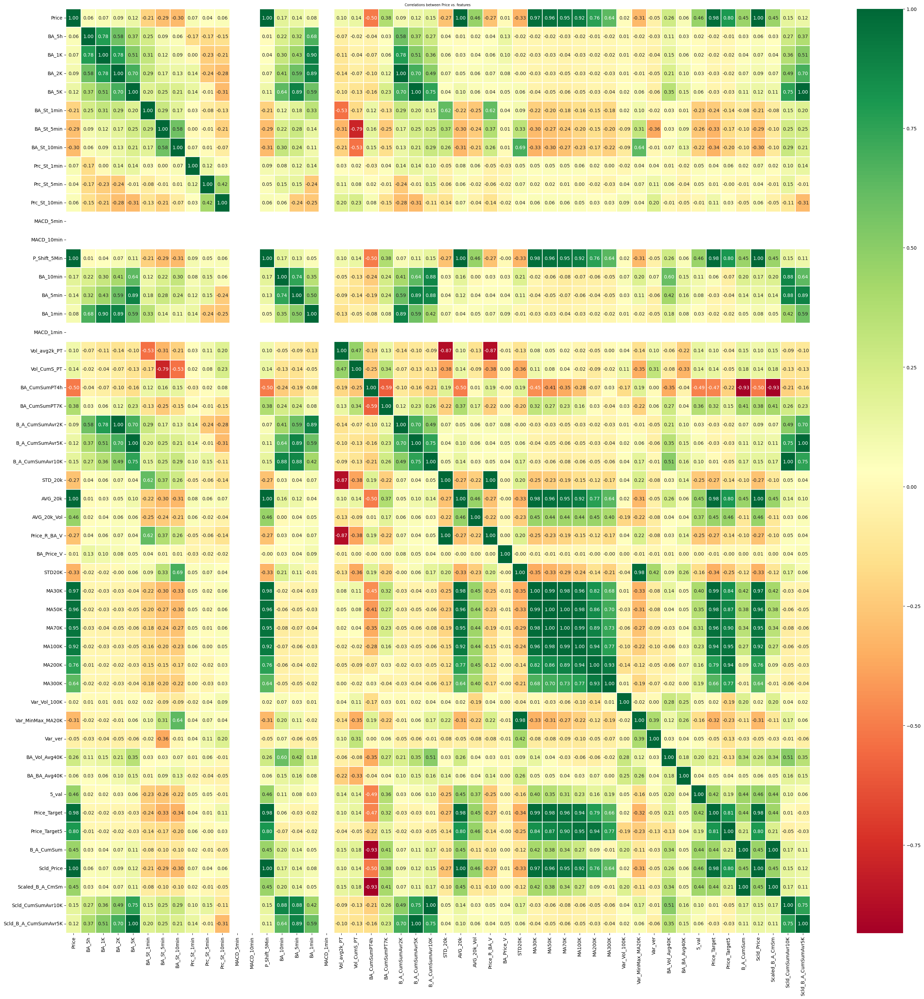

In [272]:
#Seaborn heatmap of correlations in es data

plt.subplots(figsize=(35,35))

#matrix = np.tril(es.corr())
#sns.heatmap(es.corr(), linewidths=.1, annot=True, cmap='coolwarm', center=0, mask=matrix);
sns.heatmap(es3[ar].corr(), linewidths=.2, annot=True, cmap='RdYlGn',  fmt='.2f');
plt.title('Correlations between Price vs. features ', fontsize=7)

In [277]:
# function to create scatterplots of Price against desired columns
def scatterplots(columns, ncol=None, figsize=(50, 50)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'Price', data=es3, alpha=0.5)
        ax.set(xlabel=col, ylabel='Price')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [275]:

features = [x for x in es3.columns if x not in ['Time', 'Hour', 'Minute', 'Second', 'Msec']]

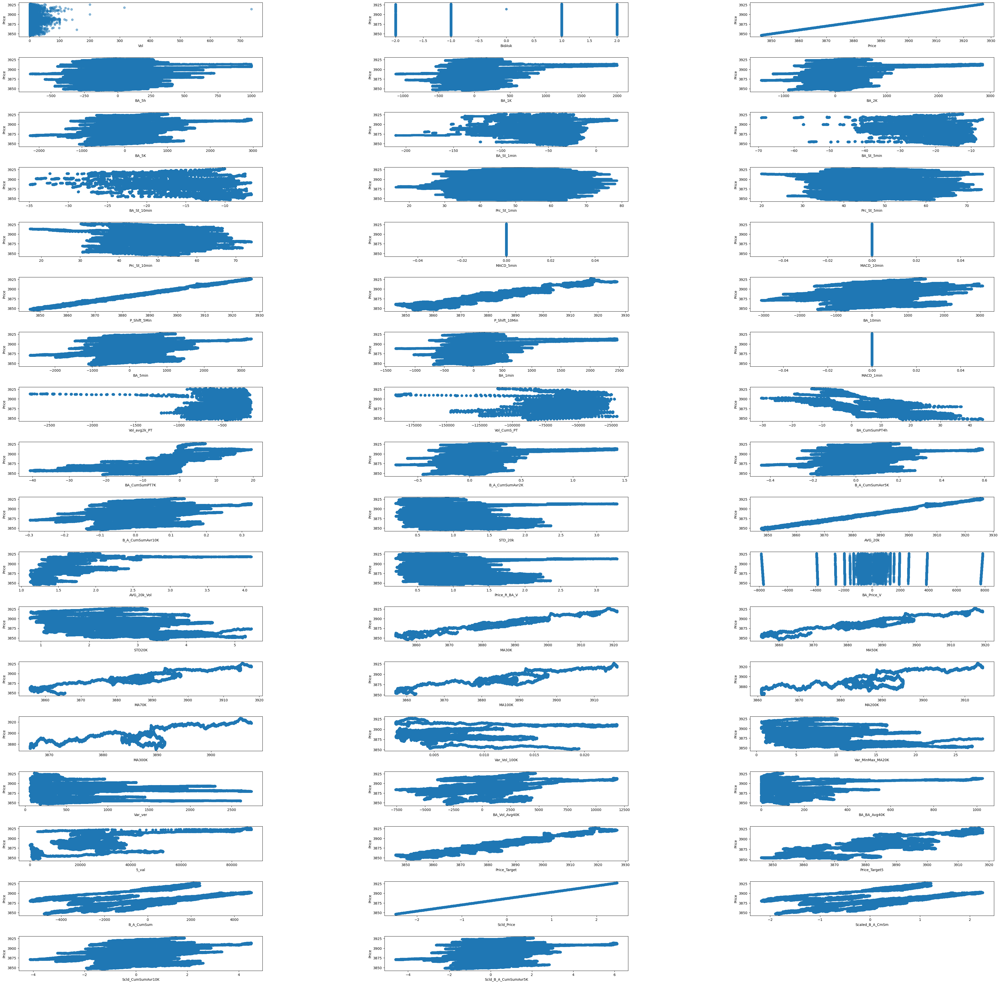

In [278]:
scatterplots(features, ncol=3, figsize=(50, 50)) # scatterplots(features, ncol=5, figsize=(17, 17))

In [281]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K', 'Scld_B_A_CumSumAvr5K',
       'MA70K_ratio', 'MA100K_ratio', 'Var_MinMax_MA20K_ratio',
       'B_A_CumSumAvr10K_ratio', 'MA300K_ratio', 'Var_Vol_100K_ratio',
       '7_ratio', '8_ratio', 'BA_5h_ratio', 'BA_1K_ratio', 

In [289]:
es3['MA70K_ratio'] = es3.Price / es3.MA70K
es3['MA100K_ratio'] = es3.Price / es3.MA100K
es3['Var_MinMax_MA20K_ratio'] = es3.Price / es3.Var_MinMax_MA20K
es3['B_A_CumSumAvr10K_ratio'] = es3.Price / es3.B_A_CumSumAvr10K
# 'MA300K_ratio', 'Var_Vol_100K_ratio', '7_ratio', '8_ratio','BA_5h_ratio','BA_1K_ratio', 'BA_2K_ratio', 'BA_5K_ratio', 'BA_St_1h_ratio','BA_St_1h_ratio',
# 'BA_St_1K_ratio','BA_St_5k_ratio', 'Price_R_BA_V_ratio','Prc_St_1h_ratio', 'Prc_St_1k_ratio','MACD_5min_ratio', 'MACD_10min_ratio'

es3['MA300K_ratio'] = es3.Price / es3.MA300K
es3['Var_Vol_100K_ratio'] = es3.Price / es3[ 'Var_Vol_100K']
es3['7_ratio'] = es3.Price / es3.MA200K
es3['8_ratio'] = es3.Price / es3.BA_Vol_Avg40K  
   
es3['BA_5h_ratio'] =  es3.Price / es3['BA_St_5min']
es3['BA_1K_ratio'] =  es3.Price / es3['BA_1K']
es3['BA_2K_ratio'] = es3.Price / es3['BA_2K']
es3['BA_5K_ratio'] = es3.Price / es3['BA_5K']

es3['BA_St_1h_ratio'] = es3.Price / es3['BA_St_5min']
es3['BA_St_1K_ratio'] = es3.Price / es3['BA_St_1min']
es3['BA_St_5k_ratio'] = es3.Price / es3['BA_St_5min']

es3['Price_R_BA_V_ratio'] = es3.Price / es3['Price_R_BA_V']

es3['Prc_St_1h_ratio'] = es3.Price / es3['BA_St_5min']

es3['Prc_St_1k_ratio'] = es3.Price / es3['Prc_St_1min']
es3['MACD_5min_ratio'] = es3.Price / es3['MACD_5min']
es3['MACD_10min_ratio'] = es3.Price / es3['MACD_10min']



In [294]:
es3.shape # (1321251, 73)

(1321251, 73)

In [290]:
es3.columns

Index(['Vol', 'BidAsk', 'Price', 'BA_5h', 'BA_1K', 'BA_2K', 'BA_5K',
       'BA_St_1min', 'BA_St_5min', 'BA_St_10min', 'Prc_St_1min', 'Prc_St_5min',
       'Prc_St_10min', 'MACD_5min', 'MACD_10min', 'P_Shift_5Min',
       'P_Shift_10Min', 'BA_10min', 'BA_5min', 'BA_1min', 'MACD_1min',
       'Vol_avg2k_PT', 'Vol_CumS_PT', 'BA_CumSumPT4h', 'BA_CumSumPT7K',
       'B_A_CumSumAvr2K', 'B_A_CumSumAvr5K', 'B_A_CumSumAvr10K', 'STD_20k',
       'AVG_20k', 'AVG_20k_Vol', 'Price_R_BA_V', 'BA_Price_V', 'STD20K',
       'MA30K', 'MA50K', 'MA70K', 'MA100K', 'MA200K', 'MA300K', 'Var_Vol_100K',
       'Var_MinMax_MA20K', 'Var_ver', 'BA_Vol_Avg40K', 'BA_BA_Avg40K', '5_val',
       'Price_Target', 'Price_Target5', 'B_A_CumSum', 'Scld_Price',
       'Scaled_B_A_CmSm', 'Scld_CumSumAvr10K', 'Scld_B_A_CumSumAvr5K',
       'MA70K_ratio', 'MA100K_ratio', 'Var_MinMax_MA20K_ratio',
       'B_A_CumSumAvr10K_ratio', 'MA300K_ratio', 'Var_Vol_100K_ratio',
       '7_ratio', '8_ratio', 'BA_5h_ratio', 'BA_1K_ratio', 

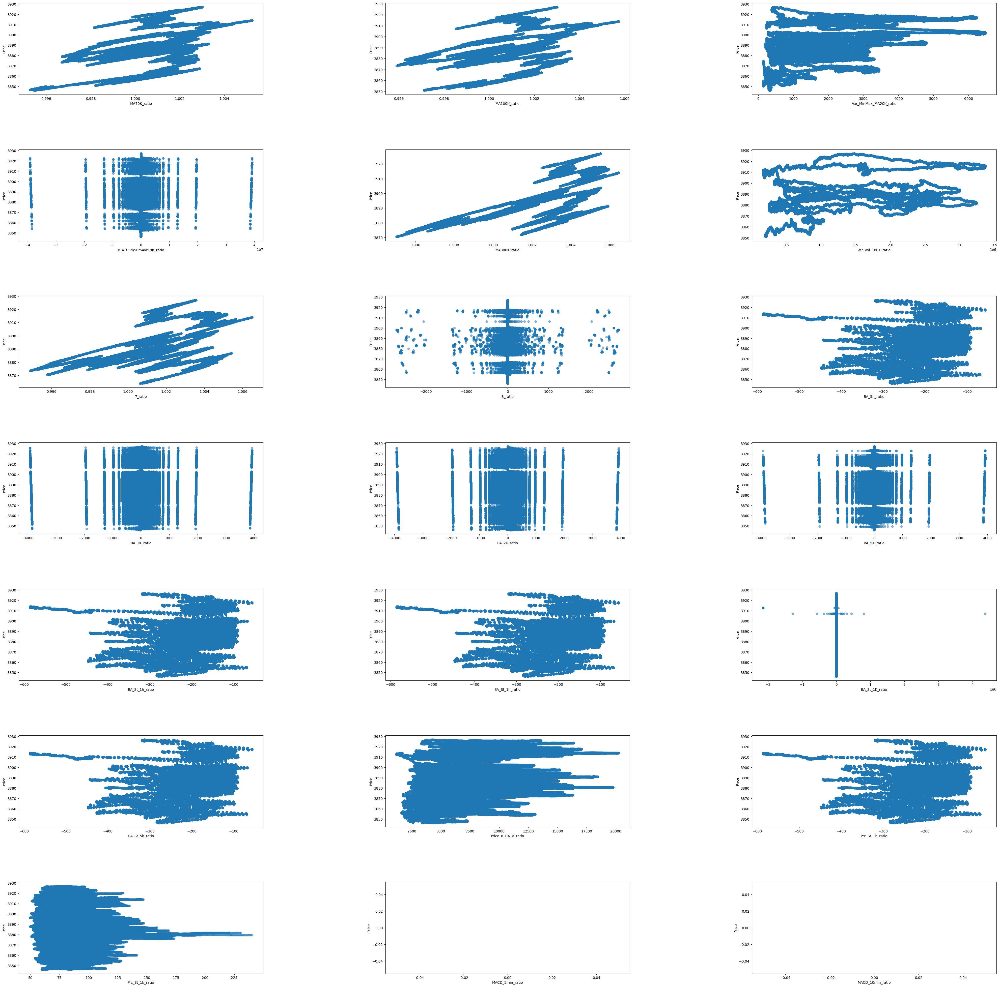

In [293]:
scatterplots(['MA70K_ratio', 'MA100K_ratio', 'Var_MinMax_MA20K_ratio', 'B_A_CumSumAvr10K_ratio', 'MA300K_ratio', 'Var_Vol_100K_ratio', '7_ratio', '8_ratio','BA_5h_ratio','BA_1K_ratio', 'BA_2K_ratio', 'BA_5K_ratio', 'BA_St_1h_ratio','BA_St_1h_ratio',
'BA_St_1K_ratio','BA_St_5k_ratio', 'Price_R_BA_V_ratio','Prc_St_1h_ratio', 'Prc_St_1k_ratio','MACD_5min_ratio', 'MACD_10min_ratio'], ncol=3)

In [ ]:
import yfinance as yf
import utils

# @param ticker_symbol - str
# @param time_period - Valid Periods: 1d, 5d, 1mo,3mo,6mo,1y,2y,5y,10y,ytd,maxi
# @param time_interval - Valid Periods:`1m , 2m, 5m, 15m, 30m, 60m, 90m, 1h, 1d, 5d, 1wk, 1mo, 3mo
def get_historical_data(ticker_symbol: str, time_period: str, time_interval: str) -> yf.Ticker:
    return yf.Ticker(ticker_symbol).history(period=time_period, interval=time_interval)

#todo: check all is functional
def get_current_stock_data(ticker_symbol: str) -> {}:
    historical_stock_data = get_historical_data(ticker_symbol, '3d', '2m')
    stock_data = historical_stock_data.iloc[-1].to_dict()
    
    del stock_data['Dividends']
    del stock_data['Stock Splits']

    stock_data['SMA'] = util.calculate_sma(historical_stock_data)[0]#method broken because of history access
    stock_data['PREVSMA'] = util.calculate_sma(historical_stock_data)[1]
    stock_data['EMA'] = util.calculate_ema(historical_stock_data)
    stock_data['PREVPRICE'] = historical_stock_data.iloc[-2].to_dict()['Close']#might need to change, only checks price 2 minutes ago

    return stock_data

def get_price_slope(ticker_symbol:str): #refactor maybe
    n = 5 # checks last 3 minutes of data
    historical_stock_data = get_historical_data(ticker_symbol, '1d', '1m')
    stock_price_by_time = []
    for i in range(-n, 0):
        stock_price_by_time.append(historical_stock_data.iloc[i].to_dict()['Close'])
    slope = util.linear_regress_slope(1, stock_price_by_time)
    return slope

def get_volume_slope(ticker_symbol:str): #refactor maybe
    n = 5 # checks last 3 minutes of data
    historical_stock_data = get_historical_data(ticker_symbol, '1d', '1m')
    stock_volume_by_time = []
    for i in range(-n, 0):
        stock_volume_by_time.append(historical_stock_data.iloc[i].to_dict()['Volume'])
    slope = util.linear_regress_slope(1, stock_volume_by_time)
    return slope

def get_stock_company_name(ticker_symbol:str):
    return yf.Ticker(ticker_symbol).info['longName']

In [ ]:
import time
starttime = time.time()
while True:
    print('tick' + starttime)
    time.sleep(5.0 - ((time.time() - starttime ) % 5.0))

In [1]:
# Define a function called plot_timeseries
def plot_timeseries(axes, x, y, color, xlabel, ylabel):

  # Plot the inputs x,y in the provided color
  axes.plot(x, y, color=color)

  # Set the x-axis label
  axes.set_xlabel(xlabel)

  # Set the y-axis label
  axes.set_ylabel(ylabel, color=color)

  # Set the colors tick params for y-axis
  axes.tick_params('y', colors=color)

In [ ]:
fig, ax = plt.subplots()

# Plot the CO2 levels time-series in blue
plot_timeseries(ax, climate_change.index, climate_change["co2"], 'blue', "Time (years)", "CO2 levels")

# Create a twin Axes object that shares the x-axis
ax2 = ax.twinx()

# Plot the relative temperature data in red
plot_timeseries(ax2, climate_change.index, climate_change['relative_temp'], 'red', "Time (years)", "Relative temperature (Celsius)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Plot the CO2 levels time-series in blue
plot_timeseries(ax, climate_change.index, climate_change["co2"], 'blue', "Time (years)", "CO2 levels")

# Create an Axes object that shares the x-axis
ax2 = ax.twinx()

# Plot the relative temperature data in red
plot_timeseries(ax2, climate_change.index, climate_change['relative_temp'], 'red', "Time (years)", "Relative temp (Celsius)")

# Annotate the point with relative temperature >1 degree
ax2.annotate(">1 degree", xy=(pd.Timestamp('2015-10-06'), 1), xytext=(pd.Timestamp('2008-10-06'), -0.2), arrowprops={'arrowstyle':'->', 'color':'gray'})

plt.show()

In [ ]:
# Add bars for "Gold" with the label "Gold"
ax.bar(medals.index, medals["Gold"], label="Gold")

# Stack bars for "Silver" on top with label "Silver"
ax.bar(medals.index, medals["Silver"], bottom=medals["Gold"], label="Silver")

# Stack bars for "Bronze" on top of that with label "Bronze"
ax.bar(medals.index, medals["Bronze"], bottom=medals["Gold"] + medals["Silver"], label="Bronze")

# Display the legend
ax.legend()

plt.show()

In [ ]:
fig, ax = plt.subplots()
# Plot a histogram of "Weight" for mens_rowing
ax.hist(mens_rowing["Weight"])

# Compare to histogram of "Weight" for mens_gymnastics
ax.hist(mens_gymnastics["Weight"])

# Set the x-axis label to "Weight (kg)"
ax.set_xlabel("Weight (kg)")

# Set the y-axis label to "# of observations"
ax.set_ylabel("# of observations")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Plot a histogram of "Weight" for mens_rowing
ax.hist(mens_rowing["Weight"], histtype='step', label="Rowing", bins=5)

# Compare to histogram of "Weight" for mens_gymnastics
ax.hist(mens_gymnastics["Weight"], histtype='step', label="Gymnastics", bins=5)

ax.set_xlabel("Weight (kg)")
ax.set_ylabel("# of observations")

# Add the legend and show the Figure
ax.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add a bar for the rowing "Height" column mean/std
ax.bar("Rowing", mens_rowing["Height"].mean(), yerr=mens_rowing["Height"].std())

# Add a bar for the gymnastics "Height" column mean/std
ax.bar("Gymnastics", mens_gymnastics["Height"].mean(), yerr=mens_gymnastics["Height"].std())

# Label the y-axis
ax.set_ylabel("Height (cm)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add the Seattle temperature data in each month with standard deviation error bars
ax.errorbar(seattle_weather["MONTH"], seattle_weather["MLY-TAVG-NORMAL"], yerr=seattle_weather["MLY-TAVG-STDDEV"])

# Add the Austin temperature data in each month with standard deviation error bars
ax.errorbar(austin_weather["MONTH"], austin_weather["MLY-TAVG-NORMAL"], yerr=austin_weather["MLY-TAVG-STDDEV"])

# Set the y-axis label
ax.set_ylabel("Temperature (Fahrenheit)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add a boxplot for the "Height" column in the DataFrames
ax.boxplot([mens_rowing["Height"], mens_gymnastics["Height"]])

# Add x-axis tick labels:
ax.set_xticklabels(["Rowing", "Gymnastics"])

# Add a y-axis label
ax.set_ylabel("Height (cm)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add data: "co2" on x-axis, "relative_temp" on y-axis
ax.scatter(climate_change["co2"], climate_change["relative_temp"])

# Set the x-axis label to "CO2 (ppm)"
ax.set_xlabel("CO2 (ppm)")

# Set the y-axis label to "Relative temperature (C)"
ax.set_ylabel("Relative temperature (C)")

plt.show()

In [ ]:
fig, ax = plt.subplots()

# Add data: "co2", "relative_temp" as x-y, index as color
ax.scatter(climate_change["co2"], climate_change["relative_temp"], c=climate_change.index)

# Set the x-axis label to "CO2 (ppm)"
ax.set_xlabel("CO2 (ppm)")

# Set the y-axis label to "Relative temperature (C)"
ax.set_ylabel("Relative temperature (C)")

plt.show()

In [ ]:
# Use the "ggplot" style and create new Figure/Axes
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.plot(seattle_weather["MONTH"], seattle_weather["MLY-TAVG-NORMAL"])
plt.show()

In [ ]:
# Use the "Solarize_Light2" style and create new Figure/Axes
plt.style.use('Solarize_Light2')
fig, ax = plt.subplots()
ax.plot(austin_weather["MONTH"], austin_weather["MLY-TAVG-NORMAL"])
plt.show()

In [ ]:
fig.savefig('my_figure.png')
# Save as a PNG file with 300 dpi
fig.savefig('my_figure_300dpi.png', dpi=300)

In [ ]:
# Set figure dimensions and save as a PNG
fig.set_size_inches([3, 5])
fig.savefig('figure_3_5.png')
# Set figure dimensions and save as a PNG
fig.set_size_inches([5, 3])
fig.savefig('figure_5_3.png')

In [ ]:
fig, ax = plt.subplots()

# Loop over the different sports branches
for sport in sports:
  # Extract the rows only for this sport
  sport_df = summer_2016_medals[summer_2016_medals["Sport"] == sport]
  # Add a bar for the "Weight" mean with std y error bar
  ax.bar(sport, sport_df["Weight"].mean(), yerr=sport_df["Weight"].std())

ax.set_ylabel("Weight")
ax.set_xticklabels(sports, rotation=90)

# Save the figure to file
fig.savefig("sports_weights.png")